In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
282,2021-10-16,0.000
283,2021-10-17,0.754
284,2021-10-18,0.333
285,2021-10-19,0.458


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-11-06    0.000
2021-11-07    0.754
2021-11-08    0.333
2021-11-09    0.458
2021-11-10    1.931
Name: Vacunas, Length: 287, dtype: float64

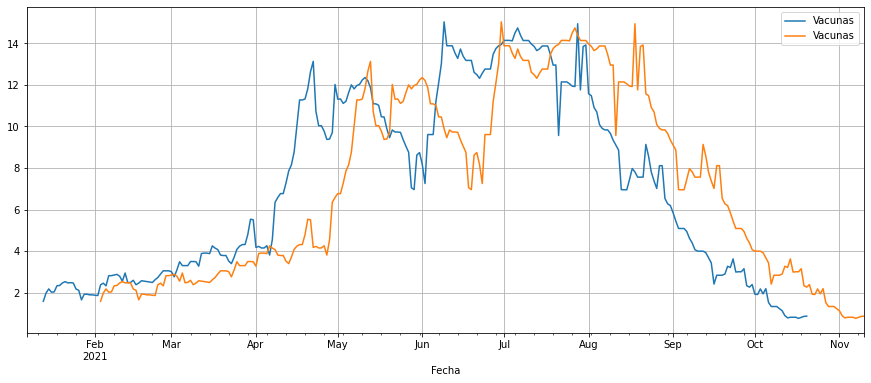

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

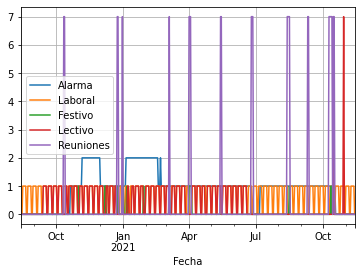

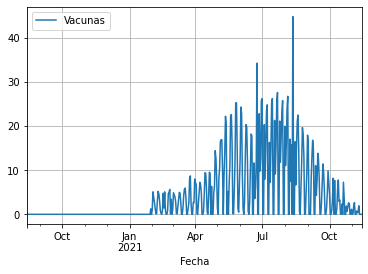

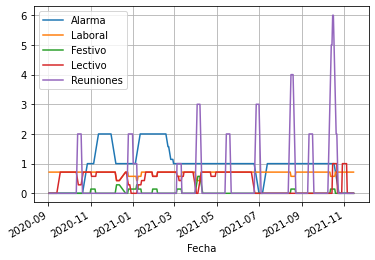

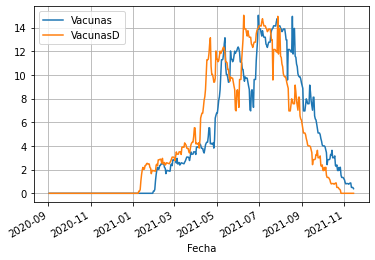

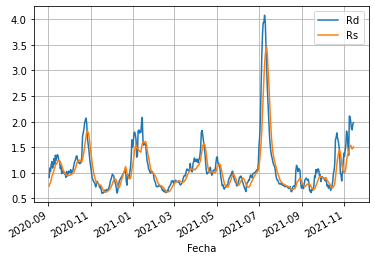

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
#puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/10/31':'2020/10/30','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/11/1','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']


puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1
puntos.loc['2021-10-12','Festivo']=1
#puntos.loc['2021-11-1','Festivo']=1



puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0
puntos.loc['2021/10/15':'2021/10/16','Lectivo']=7
puntos.loc['2021-10-29':'2021-10-30','Lectivo']=7
#puntos.loc['2021-11-1','Lectivo']=7

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7
puntos.loc['2021/10/9':'2021/10/13','Reuniones']=7
puntos.loc['2021/10/15':'2021/10/16','Reuniones']=7
#puntos.loc['2021-11-1','Reuniones']=7


puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail(20).T

Fecha,2021-10-26,2021-10-27,2021-10-28,2021-10-29,2021-10-30,2021-10-31,2021-11-01,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11,2021-11-12,2021-11-13,2021-11-14
Día de la semana,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000
Casos,66.000000,77.000000,5.100000e+01,111.000000,94.000000,50.000000,23.000000,105.000000,144.000000,1.230000e+02,152.000000,80.000000,49.000000,131.000000,155.000000,171.000000,1.790000e+02,187.000000,132.000000,57.000000
test coresp,2301.000000,2443.000000,1.792000e+03,1578.000000,1537.000000,1173.000000,883.000000,2285.000000,2600.000000,2.094000e+03,3067.000000,2237.000000,937.000000,2461.000000,2626.000000,2710.000000,2.390000e+03,2348.000000,1718.000000,1057.000000
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
Tasa de positividad (%),2.870000,3.150000,2.850000e+00,7.030000,6.120000,4.260000,2.600000,4.600000,5.540000,5.870000e+00,4.960000,3.580000,5.230000,5.320000,5.900000,6.310000,7.490000e+00,7.960000,7.680000,5.390000
Asintomáticos,37.620000,53.900000,2.601000e+01,64.380000,88.360000,32.000000,16.790000,59.850000,48.960000,6.888000e+01,80.560000,68.000000,29.400000,70.740000,91.450000,107.730000,9.487000e+01,56.100000,110.880000,30.780000
Zaragoza,49.000000,43.000000,3.100000e+01,65.000000,58.000000,38.000000,19.000000,60.000000,119.000000,1.010000e+02,116.000000,68.000000,34.000000,72.000000,108.000000,104.000000,1.070000e+02,142.000000,97.000000,25.000000
1 a 14 años,16.000000,11.000000,5.000000e+00,20.000000,6.000000,3.000000,2.000000,19.000000,38.000000,2.300000e+01,36.000000,19.000000,7.000000,15.000000,23.000000,33.000000,1.600000e+01,24.000000,20.000000,4.000000
15 a 24 años,3.000000,3.000000,4.000000e+00,4.000000,2.000000,2.000000,0.000000,2.000000,6.000000,1.000000e+01,13.000000,4.000000,4.000000,11.000000,14.000000,15.000000,1.400000e+01,11.000000,6.000000,0.000000
25 a 34 años,6.000000,15.000000,1.000000e+01,21.000000,21.000000,5.000000,5.000000,15.000000,15.000000,1.600000e+01,10.000000,7.000000,6.000000,13.000000,19.000000,18.000000,1.600000e+01,19.000000,14.000000,6.000000


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-11-15,2021-11-16,2021-11-17,2021-11-18
Día de la semana,1.000000,2.000000,3.000000,4.000000e+00
Casos,180.000000,230.000000,331.000000,NaN
test coresp,2482.000000,2919.000000,3501.000000,NaN
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000,NaN
Tasa de positividad (%),7.250000,7.880000,9.450000,NaN
Asintomáticos,88.200000,115.000000,215.150000,NaN
Zaragoza,92.000000,149.000000,209.000000,NaN
1 a 14 años,29.000000,33.000000,78.000000,NaN
15 a 24 años,7.000000,17.000000,13.000000,NaN
25 a 34 años,17.000000,20.000000,28.000000,NaN


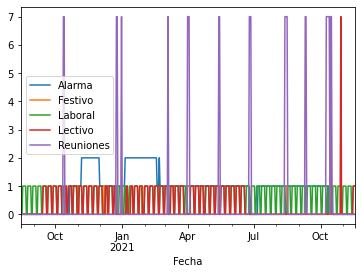

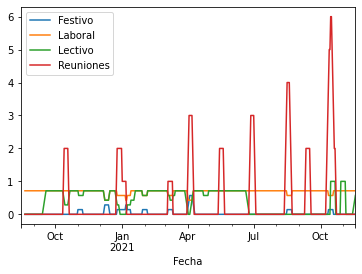

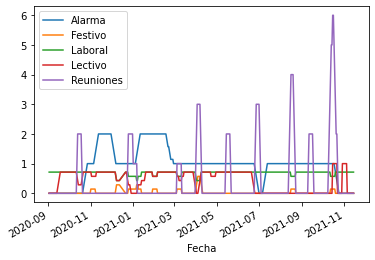

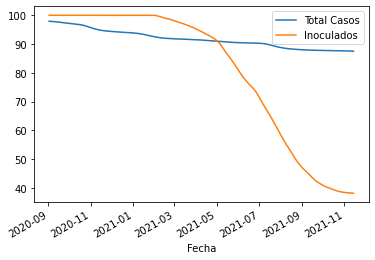

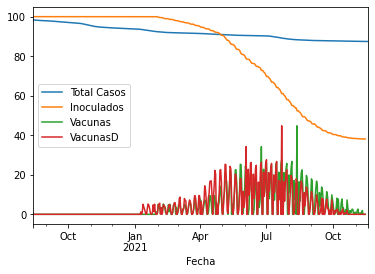

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

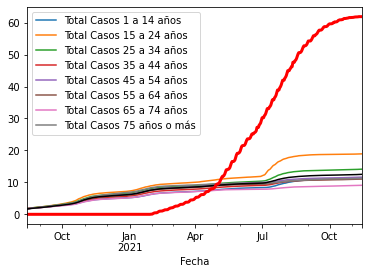

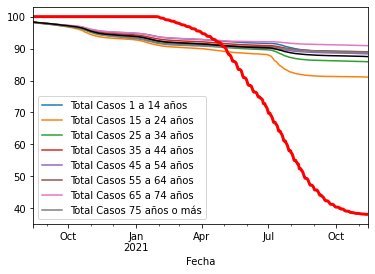

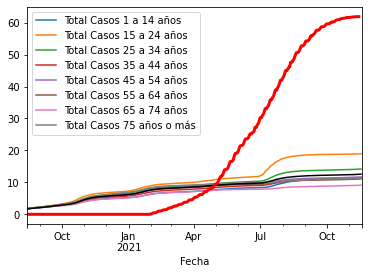

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-11-14,87.480311,38.109475
2021-11-15,87.466668,NaN
2021-11-16,87.449234,NaN


,Total Casos,Inoculados
Fecha,,
2021-11-15,87.466668,NaN
2021-11-16,87.449234,NaN
2021-11-17,87.424145,NaN
2021-11-18,NaN,NaN


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-15,1,180.0,2482.0,0.0,7.25,88.20,92.0,29.0,7.0,17.0,...,NaN,87.466668,88.613316,81.068225,85.851425,88.734549,88.322797,88.950485,90.898017,88.686853
2021-11-16,2,230.0,2919.0,0.0,7.88,115.00,149.0,33.0,17.0,20.0,...,NaN,87.449234,88.595434,81.054501,85.837312,88.717099,88.301455,88.931256,90.884702,88.667573
2021-11-17,3,331.0,3501.0,0.0,9.45,215.15,209.0,78.0,13.0,28.0,...,NaN,87.424145,88.553167,81.044006,85.817553,88.686686,88.273323,88.907504,90.863249,88.654277
2021-11-18,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-14,7,57.0,1057.0,0.0,5.39,30.78,25.0,4.0,0.0,6.0,...,90.914292,88.696825,17847.0,21338.0,17624.0,19151.0,20538.0,16509.0,9984.0,14445.0
2021-11-15,1,180.0,2482.0,0.0,7.25,88.20,92.0,29.0,7.0,17.0,...,90.898017,88.686853,17876.0,21345.0,17641.0,19186.0,20570.0,16532.0,10006.0,14460.0
2021-11-16,2,230.0,2919.0,0.0,7.88,115.00,149.0,33.0,17.0,20.0,...,90.884702,88.667573,17909.0,21362.0,17661.0,19221.0,20614.0,16566.0,10024.0,14489.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.867000,0.948942,0.912396,0.862460,0.978729,0.794097,0.919902,0.743539,0.820350,0.860277,...,1,1,1.000101,1.000178,1.000108,1.000085,1.000081,1.000076,1.000048,1.000055
2,1.193079,1.214926,0.973895,1.166275,0.973814,1.196169,0.998400,1.251187,1.152657,1.183194,...,1,1,1.000056,1.000112,1.000055,1.000036,1.000040,1.000031,1.000031,1.000036
3,1.191276,1.233539,0.967335,1.174916,0.984474,1.207212,1.013166,1.233449,1.260570,1.192331,...,1,1,1.000006,1.000011,1.000003,0.999991,0.999995,0.999991,1.000006,1.000017
4,1.201555,1.136116,1.058533,1.216707,1.009456,1.210082,1.011484,1.214398,1.270288,1.205326,...,1,1,0.999958,0.999906,0.999945,0.999961,0.999957,0.999962,0.999974,0.999968
5,1.140407,1.095632,1.050604,1.066661,0.931960,1.147917,1.013760,1.184037,1.177669,1.179308,...,1,1,0.999907,0.999816,0.999892,0.999921,0.999920,0.999930,0.999948,0.999942
6,0.836529,0.792066,1.083989,0.932175,1.105421,0.877956,1.047813,0.896528,0.801441,0.821103,...,1,1,0.999928,0.999882,0.999932,0.999957,0.999953,0.999961,0.999964,0.999957
7,0.541947,0.564788,0.944959,0.554391,1.014273,0.538113,0.994555,0.448730,0.490803,0.522263,...,1,1,1.000040,1.000079,1.000057,1.000047,1.000050,1.000044,1.000027,1.000020


Casos                        0.995971
test coresp                  0.998001
Tasa de positividad (%)      0.998816
Asintomáticos                0.996226
Asintomáticos (%)            0.999732
Zaragoza                     0.995935
Zaragoza (%)                 0.999869
1 a 14 años                  0.995981
15 a 24 años                 0.996254
25 a 34 años                 0.994829
35 a 44 años                 0.994722
45 a 54 años                 0.997135
55 a 64 años                 0.994050
65 a 74 años                 0.995844
75 años o más                0.992281
Camas Ocup                   0.997917
Camas libres                 0.999834
Camas (%)                    0.997164
UCI ocupadas                 0.998651
UCI libres con resp          0.999484
UCI (%)                      0.997850
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-11-10    1.489619
2021-11-11    1.410769
2021-11-12    1.377713
2021-11-13    1.483013
2021-11-14    1.497041
Name: Casos, Length: 458, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-11-15         NaN
2021-11-16    1.277778
2021-11-17    1.439130
2021-11-18         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-10,123.000000,2304.571429,5.310000,73.822857,61.428571,86.142857,71.182190,22.285714,10.142857,12.714286,...,38.186687,87.552526,88.699940,81.126235,85.932173,88.834831,88.412598,89.034508,90.998941,88.760837
2021-11-11,131.000000,2346.857143,5.541429,77.535714,61.000000,87.000000,67.991149,21.285714,10.714286,12.714286,...,38.171324,87.542596,88.688406,81.117585,85.923201,88.824432,88.403244,89.024732,90.987950,88.751814
2021-11-12,136.000000,2244.142857,5.970000,74.041429,57.714286,90.714286,67.936869,19.571429,10.428571,14.000000,...,38.155961,87.532287,88.677800,81.109166,85.913322,88.812966,88.393266,89.015037,90.975903,88.742127


<AxesSubplot:xlabel='Fecha'>

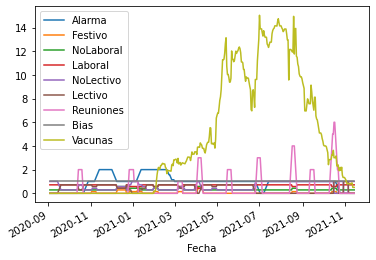

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 47.2 ms, sys: 15.8 ms, total: 63 ms
Wall time: 12.1 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000153,0.000005,-0.004894,-0.000217,1.665599e-03,-0.000458,-0.000256,-0.001056,0.000590,0.001589,...,0.969541,-0.007540,0.013458,-4.011906,-3.897008,-3.946755,-3.962159,0.003701,-7.908914,-0.000376
2020-09-04,0.000321,0.000029,-0.001785,-0.000299,1.183950e-03,-0.000187,-0.000153,-0.001603,-0.000070,0.001099,...,0.824910,-0.006684,-0.019729,-4.499128,-4.479799,-4.481862,-4.497065,0.004851,-8.978927,-0.001436
2020-09-05,0.000800,0.000009,-0.003149,-0.000331,2.164218e-03,-0.000623,0.000388,-0.000875,0.000073,0.000631,...,0.619148,-0.005274,0.030891,-2.615791,-2.511287,-2.553716,-2.573362,0.001541,-5.127078,-0.000714
2020-09-06,-0.000094,-0.000009,-0.004193,-0.000114,1.556092e-03,0.000241,0.000215,-0.000564,0.000404,0.001458,...,0.537523,-0.008573,0.015846,-2.337736,-2.275646,-2.297300,-2.316082,0.000793,-4.613382,-0.001489
2020-09-07,0.000206,-0.000004,-0.000197,0.000005,3.660234e-05,0.000419,0.001032,-0.001014,-0.000444,0.000446,...,0.266106,-0.007751,0.015418,-1.835588,-1.790220,-1.805278,-1.820531,0.000653,-3.625809,-0.003227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-10,0.000285,0.000047,0.008120,0.000307,-2.556401e-03,-0.000023,0.002387,-0.000344,-0.001294,0.000301,...,-0.056433,-0.016203,-0.007141,-1.400744,-1.483178,-1.432974,-1.450948,0.004532,-2.883922,-0.004475
2021-11-11,0.000339,0.000060,0.010616,0.000194,2.097920e-08,-0.000383,0.001567,-0.000217,-0.000680,0.000126,...,0.019668,-0.016635,-0.010384,-1.118608,-1.148358,-1.120741,-1.146225,0.004641,-2.266966,-0.002424
2021-11-12,0.000058,0.000099,0.018779,0.000578,-6.061847e-04,-0.000624,0.000955,-0.000538,-0.000267,-0.000711,...,0.035950,-0.018237,-0.064032,-0.881234,-0.947055,-0.904297,-0.923991,0.007562,-1.828289,-0.004105



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


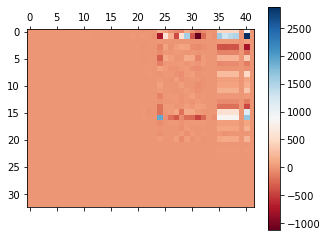

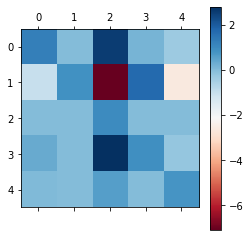

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 430) = (42, 42)·(42, 42)·(42, 430)
CPU times: user 88.8 ms, sys: 11.3 ms, total: 100 ms
Wall time: 20.8 ms


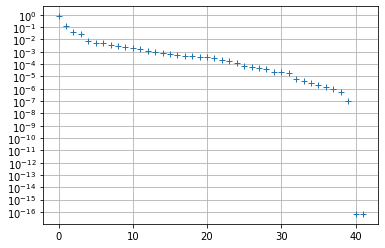

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.115084,0.251364,-0.135921,0.674587,-0.104107,0.035433,0.043798,-0.053502,0.409108,0.099442,...,-0.000623,-0.001462,-0.001658,-0.000104,-0.000160,-0.000084,-0.000007,-0.000005,8.798165e-18,1.212426e-17
test coresp,-0.886221,0.334819,-0.103870,-0.299606,0.004183,-0.017850,-0.002932,0.017148,0.009456,-0.029686,...,0.000072,0.000071,-0.000020,-0.000013,-0.000003,0.000023,-0.000006,0.000003,2.312897e-19,1.330270e-19
Tasa de positividad (%),-0.003432,0.000964,-0.000361,0.023484,0.011169,0.004055,-0.014633,0.009073,0.025562,0.011604,...,0.007021,0.002333,-0.004627,0.004902,0.001322,0.006708,-0.000557,0.000426,-1.196656e-16,5.421309e-18
Asintomáticos,-0.058273,0.133586,-0.092509,0.335231,-0.124527,-0.204924,0.361616,-0.163344,-0.734815,0.024556,...,-0.000048,0.000214,0.000356,0.000162,0.000283,0.000080,0.000049,-0.000005,-3.077745e-18,-4.571575e-18
Asintomáticos (%),-0.014995,-0.026926,-0.005479,-0.018389,-0.109168,-0.053031,0.096623,-0.342170,-0.130999,0.045683,...,0.002115,-0.001189,0.000159,0.000292,-0.001163,0.000310,-0.000101,-0.000025,-1.617389e-17,-6.242678e-18
Zaragoza,-0.080592,0.161122,-0.090727,0.424586,0.038088,0.213531,-0.304850,0.239132,-0.143535,-0.043118,...,-0.001210,0.000130,0.000552,0.000040,-0.000242,0.000079,-0.000114,-0.000016,-3.652608e-18,-2.290403e-18
Zaragoza (%),-0.021357,-0.042608,0.002941,-0.033097,-0.036500,0.183696,-0.145055,-0.083890,-0.147735,0.241842,...,-0.001276,-0.000927,0.000436,0.000438,-0.000162,-0.000126,-0.000252,0.000056,1.004518e-17,1.671496e-17
1 a 14 años,-0.013981,0.023781,-0.024927,0.044024,-0.049550,-0.318454,0.040536,0.326026,0.025685,0.512689,...,-0.000030,-0.002317,0.001084,0.000932,0.000815,-0.000301,0.000431,-0.000026,-2.900571e-18,-1.511717e-17
15 a 24 años,-0.017543,0.037703,-0.175607,0.155856,0.793529,0.029497,-0.022162,-0.333236,0.084145,-0.083853,...,0.000768,0.000749,0.001928,0.000087,-0.000008,-0.000030,0.000273,0.000001,3.090744e-19,-6.305619e-18
25 a 34 años,-0.014195,0.031929,-0.060304,0.094756,0.128865,-0.044392,0.027365,0.026277,-0.100464,0.108921,...,-0.000284,0.000603,0.001741,0.001215,-0.000517,-0.000538,0.000112,0.000043,-8.527559e-18,-1.452790e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.36 ms, sys: 704 µs, total: 3.07 ms
Wall time: 2.62 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 174 ms, sys: 4.65 ms, total: 178 ms
Wall time: 32.3 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.053383,5.702822e-03,3.414868,2.255891e-01,-0.443201,-0.285994,0.279144,-0.882232,0.390635,-0.399908,...,-5.616331,-1.401939,-21.705997,10.060562,-10.673116,-0.444339,-0.168215,-0.358435,-0.612554,0.007462
test coresp,-3.609690,8.649332e-01,1.322125,2.688664e+00,-3.993367,0.731980,-0.768869,2.242306,4.094025,-0.379926,...,-64.635267,13.875814,-103.873326,155.594382,-160.409112,-40.664186,35.849455,-13.746657,-4.814731,0.146086
Tasa de positividad (%),0.012713,4.681912e-04,1.005637,-7.608985e-03,-0.000754,-0.009989,0.009455,-0.023299,-0.002311,0.006632,...,-0.111665,-0.426816,-0.243116,-0.293853,0.302553,0.108741,-0.100041,0.067722,0.008700,-0.003738
Asintomáticos,0.060892,2.169627e-03,2.700200,9.740721e-01,-0.212346,-0.103126,0.387141,-0.337656,0.313520,-0.310417,...,-4.623160,-2.242198,-6.401947,3.985816,-4.070236,-0.163856,0.079436,-0.982207,-0.084420,-0.887213
Asintomáticos (%),0.023646,6.982978e-04,0.386708,1.307864e-03,0.836794,0.015065,0.093406,-0.043120,-0.018156,-0.070284,...,-1.154971,0.471112,0.515608,0.786488,-0.750341,0.080751,-0.044604,0.017563,0.036147,-0.200652
Zaragoza,0.127169,3.526990e-03,1.545008,1.361933e-01,-0.041383,0.616998,0.259996,-0.514906,0.336637,-0.286651,...,9.790750,0.142895,3.095833,-5.846647,5.673980,0.289800,-0.462467,-0.401354,-0.172667,-0.277771
Zaragoza (%),-0.026221,-9.881506e-04,-0.394228,-7.984689e-03,0.037395,0.009165,0.872896,0.032377,0.027933,0.035628,...,4.758475,0.821273,7.196485,-5.191094,5.327304,0.027914,0.108297,-0.061074,0.136211,-0.155893
1 a 14 años,-0.034939,1.281205e-04,0.466560,6.600665e-02,-0.098335,-0.038337,0.080194,0.846995,0.071592,0.050863,...,0.003748,-0.124405,-1.704740,-0.268117,0.238294,-0.365491,0.335668,-0.031757,-0.029823,-0.088354
15 a 24 años,0.059606,3.214242e-03,0.854872,2.331754e-02,-0.232390,-0.044313,0.025037,-0.243383,0.986026,-0.195130,...,-7.267534,-2.206154,-7.704389,4.799642,-4.833410,-0.372166,0.338397,0.153373,-0.033768,0.539606
25 a 34 años,0.001577,1.341614e-03,0.652323,2.455779e-02,-0.014739,-0.027847,0.033567,-0.120754,0.089108,0.828423,...,-0.645166,-0.369371,-1.391437,1.666556,-1.725990,-0.344032,0.284599,-0.168907,-0.059434,-0.010628


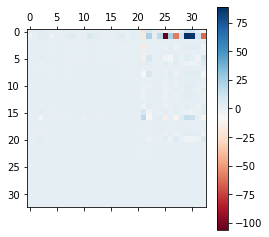

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.053383,5.702822e-03,3.414868,2.255891e-01,-0.443201,-0.285994,0.279144,-0.882232,0.390635,-0.399908,...,0.663870,2.065883,-13.245955,-0.920236,-7.582514,1.580699,12.080990,10.795517,0.519779,-5.616331
test coresp,-3.609690,8.649332e-01,1.322125,2.688664e+00,-3.993367,0.731980,-0.768869,2.242306,4.094025,-0.379926,...,-0.504411,16.835537,-106.270284,23.371683,-59.558196,9.324953,89.061470,86.617395,10.023633,-64.635267
Tasa de positividad (%),0.012713,4.681912e-04,1.005637,-7.608985e-03,-0.000754,-0.009989,0.009455,-0.023299,-0.002311,0.006632,...,-0.002206,-0.031755,0.213304,0.020886,-0.003891,0.036810,-0.121306,-0.093878,0.069524,-0.111665
Asintomáticos,0.060892,2.169627e-03,2.700200,9.740721e-01,-0.212346,-0.103126,0.387141,-0.337656,0.313520,-0.310417,...,-0.216152,0.274065,-1.452312,1.455217,-2.673035,0.970992,2.093727,2.422733,1.596269,-4.623160
Asintomáticos (%),0.023646,6.982978e-04,0.386708,1.307864e-03,0.836794,0.015065,0.093406,-0.043120,-0.018156,-0.070284,...,-0.228982,-0.106993,0.928587,0.898114,-0.078791,0.159213,-0.621700,-0.304819,0.558683,-1.154971
Zaragoza,0.127169,3.526990e-03,1.545008,1.361933e-01,-0.041383,0.616998,0.259996,-0.514906,0.336637,-0.286651,...,1.069055,0.500065,-4.833233,-6.450054,1.814517,-1.395339,3.164747,0.679793,-4.429138,9.790750
Zaragoza (%),-0.026221,-9.881506e-04,-0.394228,-7.984689e-03,0.037395,0.009165,0.872896,0.032377,0.027933,0.035628,...,0.173424,-0.464647,2.610844,-2.138729,2.755071,-0.785729,-2.518032,-2.958753,-1.374478,4.758475
1 a 14 años,-0.034939,1.281205e-04,0.466560,6.600665e-02,-0.098335,-0.038337,0.080194,0.846995,0.071592,0.050863,...,0.013843,0.115949,-0.601124,-0.308342,-0.321502,0.111800,0.595554,0.494478,-0.047955,0.003748
15 a 24 años,0.059606,3.214242e-03,0.854872,2.331754e-02,-0.232390,-0.044313,0.025037,-0.243383,0.986026,-0.195130,...,-0.314206,0.104894,-0.223693,3.048846,-3.093824,1.305902,1.407403,2.221587,2.868025,-7.267534
25 a 34 años,0.001577,1.341614e-03,0.652323,2.455779e-02,-0.014739,-0.027847,0.033567,-0.120754,0.089108,0.828423,...,0.046367,0.196535,-1.316535,0.099808,-0.732083,0.107023,1.105067,1.044484,0.052694,-0.645166


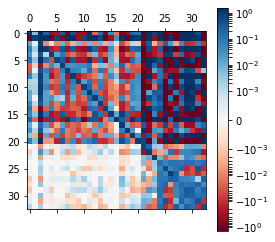

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 430) = (33, 33)·(33, 33)·(33, 430)
CPU times: user 36.5 ms, sys: 32.4 ms, total: 68.9 ms
Wall time: 11 ms


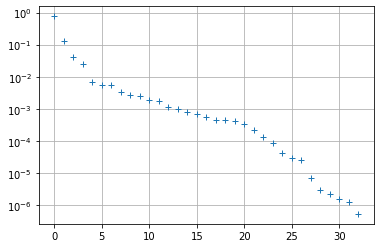

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.115069,0.251480,-0.134433,0.674600,-0.105294,0.036024,-0.045590,0.060593,-0.402650,0.128627,...,-0.048338,-0.008669,-0.001038,-0.007869,-0.004367,-0.002018,-0.001655,-0.000056,-0.000328,-0.000053
test coresp,-0.886304,0.334527,-0.104703,-0.299386,0.004798,-0.018003,0.003116,-0.017990,-0.011192,-0.028817,...,-0.004022,0.000111,0.001008,-0.000059,0.000007,0.000052,-0.000023,-0.000012,0.000010,0.000026
Tasa de positividad (%),-0.003431,0.000967,-0.000320,0.023424,0.010923,0.004088,0.014520,-0.007856,-0.025945,0.016930,...,-0.919260,-0.013011,0.242687,0.018156,-0.022656,-0.012877,-0.005889,0.005862,0.004409,0.005676
Asintomáticos,-0.058254,0.133688,-0.092230,0.334960,-0.128006,-0.207589,-0.357198,0.156768,0.739949,-0.028164,...,-0.017681,0.002543,0.005432,0.000403,-0.000065,-0.000586,0.000391,0.000155,0.000254,-0.000067
Asintomáticos (%),-0.014996,-0.026939,-0.005716,-0.018724,-0.110551,-0.053827,-0.094795,0.338831,0.135027,0.035351,...,-0.001844,-0.028353,0.000059,-0.016473,0.001086,0.004206,-0.000404,0.000140,-0.000746,0.000744
Zaragoza,-0.080570,0.161243,-0.089669,0.425159,0.040149,0.216134,0.303842,-0.242169,0.136969,-0.056340,...,0.062069,0.026121,0.001090,0.013629,0.003074,-0.000779,0.000878,0.000093,-0.000176,0.000212
Zaragoza (%),-0.021355,-0.042616,0.002997,-0.032886,-0.035045,0.185802,0.144000,0.083771,0.162605,0.225359,...,-0.154742,-0.050823,0.004824,-0.021988,-0.003908,-0.003061,0.000166,0.000392,-0.000076,-0.000077
1 a 14 años,-0.013982,0.023780,-0.024696,0.044313,-0.050245,-0.317114,-0.038841,-0.320008,-0.005766,0.553683,...,0.077087,-0.012429,-0.023033,-0.004219,-0.004345,-0.003321,0.000435,0.000909,0.000906,-0.000635
15 a 24 años,-0.017541,0.037705,-0.175136,0.157115,0.793412,0.024076,0.020267,0.334260,-0.085304,-0.080036,...,0.057071,-0.014630,0.004479,-0.007655,0.007866,0.001719,0.001590,-0.000037,0.000309,0.000049
25 a 34 años,-0.014190,0.031951,-0.060138,0.095060,0.128496,-0.045426,-0.026656,-0.026237,0.103092,0.118779,...,0.039608,-0.013780,-0.036752,0.009238,0.002263,0.002709,0.001932,0.000993,-0.000768,-0.000301


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

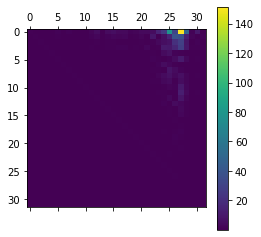

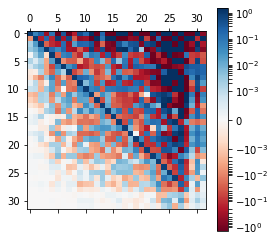

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

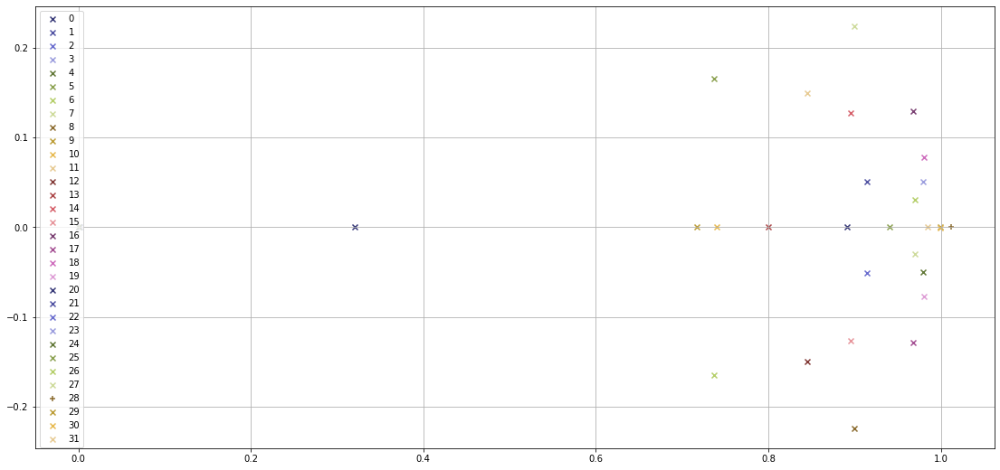

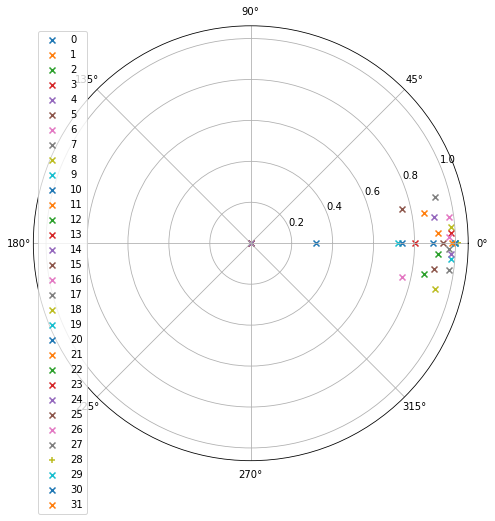

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-10,4.0,131.000000,2346.857143,0.0,5.541429,77.535714,87.000000,21.285714,10.714286,12.714286,...,38.171324,87.542596,88.688406,81.117585,85.923201,88.824432,88.403244,89.024732,90.987950,88.751814
2021-11-11,4.0,136.000000,2244.142857,0.0,5.970000,74.041429,90.714286,19.571429,10.428571,14.000000,...,38.155961,87.532287,88.677800,81.109166,85.913322,88.812966,88.393266,89.015037,90.975903,88.742127
2021-11-12,4.0,143.428571,2170.000000,0.0,6.555714,80.167143,94.857143,19.714286,10.714286,15.000000,...,38.140599,87.521416,88.667117,81.100517,85.902737,88.800644,88.382179,89.004938,90.963222,88.732250
2021-11-13,4.0,144.571429,2187.142857,0.0,6.578571,80.364286,93.571429,19.285714,10.142857,15.000000,...,38.128568,87.510457,88.656667,81.092328,85.892152,88.787752,88.371023,88.994758,90.950117,88.722278
2021-11-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-10,116.750017,2350.442654,4.960378,61.591390,57.628110,77.615911,69.300031,21.109076,13.801164,12.073565,...,38.250157,87.565467,88.626380,81.162805,85.904086,88.835346,88.481293,89.094581,91.001227,88.711298
2021-11-11,124.331525,2399.491152,5.109414,66.495399,58.102200,84.274611,70.559780,21.968602,14.996038,12.819852,...,38.222877,87.555921,88.617540,81.154190,85.894759,88.825112,88.473079,89.085514,90.987954,88.705494
2021-11-12,130.277157,2418.113129,5.182432,74.117274,61.259399,85.004062,67.640148,21.736270,14.828125,13.793193,...,38.198010,87.547646,88.606689,81.145132,85.882955,88.815616,88.456983,89.078328,90.976347,88.699791
2021-11-13,140.931707,2454.985030,5.469233,78.849698,60.740443,87.366558,64.398807,21.250119,15.515280,14.376662,...,38.182903,87.537983,88.592687,81.138443,85.867399,88.807564,88.447224,89.069006,90.964897,88.688770
2021-11-14,148.151103,2359.945723,5.957178,76.803898,57.896979,91.435401,64.232469,20.163537,16.011155,15.886179,...,38.169998,87.526651,88.579719,81.130284,85.856114,88.795441,88.437738,89.058921,90.953974,88.676199


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,...,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000,430.000000
mean,4.433433,3.209464,2.773994,10.531784,1.438124,-0.108176,-3.473143,3.193276,10.498897,7.344678,...,0.203061,0.006577,-0.102554,0.035439,-0.032385,-0.009500,0.078956,0.064435,-0.010060,-0.088057
std,6.415512,3.917120,4.466817,12.120795,3.712350,5.447859,2.244427,7.974350,23.599571,10.188844,...,0.215445,0.008378,0.023725,0.015863,0.016794,0.013829,0.039680,0.024696,0.009642,0.047339
min,-13.285624,-8.112694,-13.066565,-12.242396,-8.046141,-18.876357,-10.784487,-21.273570,-82.451612,-13.776503,...,-0.016776,-0.013293,-0.158767,0.007446,-0.074775,-0.042300,0.020221,0.013591,-0.038502,-0.185718
25%,0.527014,0.816097,-0.062698,2.633155,-1.057052,-3.049674,-4.788047,-1.646073,-0.976759,0.872870,...,0.018982,0.001921,-0.120712,0.022328,-0.043526,-0.018027,0.046597,0.046670,-0.015862,-0.136287
50%,3.123684,2.655555,2.860491,7.831220,1.109047,-0.374280,-3.450536,2.129103,6.012950,4.689400,...,0.106172,0.006437,-0.098911,0.033192,-0.034273,-0.010923,0.065171,0.059548,-0.009692,-0.076280
75%,7.119410,5.309160,5.867921,15.086011,3.628057,2.717293,-2.065579,7.295486,17.296434,10.105561,...,0.352951,0.010786,-0.083368,0.046597,-0.022001,-0.001975,0.119340,0.087418,-0.003578,-0.049815
max,41.131511,26.933865,16.088152,60.119551,18.220396,18.648863,8.235758,47.817977,159.278967,50.542892,...,0.808954,0.128136,0.003461,0.141910,0.119982,0.094448,0.206290,0.157437,0.074048,0.139883


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          82.571429
test coresp                  1692.571429
Tasa de positividad (%)         4.714286
Asintomáticos                  48.050000
Asintomáticos (%)              61.571429
Zaragoza                       55.714286
Zaragoza (%)                   68.490777
1 a 14 años                    13.285714
15 a 24 años                    2.857143
25 a 34 años                   13.142857
35 a 44 años                   13.428571
45 a 54 años                   13.571429
55 a 64 años                    9.714286
65 a 74 años                    7.714286
75 años o más                   7.857143
Camas Ocup                     70.428571
Camas libres                 1283.142857
Camas (%)                       5.494881
UCI ocupadas                   14.000000
UCI libres con resp            88.571429
UCI (%)                        15.918728
Rs                              1.102797
Rd                              1.560981
Inoculados                     38.365837
Total Casos     

Casos                          92.857143
test coresp                  1735.714286
Tasa de positividad (%)         5.145714
Asintomáticos                  54.174286
Asintomáticos (%)              62.285714
Zaragoza                       65.714286
Zaragoza (%)                   71.537850
1 a 14 años                    15.857143
15 a 24 años                    3.714286
25 a 34 años                   14.000000
35 a 44 años                   16.285714
45 a 54 años                   15.142857
55 a 64 años                   10.428571
65 a 74 años                    7.571429
75 años o más                   8.714286
Camas Ocup                     72.857143
Camas libres                 1274.142857
Camas (%)                       5.741649
UCI ocupadas                   14.000000
UCI libres con resp            90.285714
UCI (%)                        15.607363
Rs                              1.230016
Rd                              1.815572
Inoculados                     38.340406
Total Casos     

Casos                          93.796681
test coresp                  1824.563907
Tasa de positividad (%)         4.756753
Asintomáticos                  54.509197
Asintomáticos (%)              61.827423
Zaragoza                       56.765898
Zaragoza (%)                   66.486351
1 a 14 años                    14.085524
15 a 24 años                    7.525030
25 a 34 años                   13.819942
35 a 44 años                   15.245874
45 a 54 años                   13.656872
55 a 64 años                   11.621769
65 a 74 años                    8.758638
75 años o más                   8.891985
Camas Ocup                     68.779140
Camas libres                 1270.789857
Camas (%)                       5.566881
UCI ocupadas                   12.581563
UCI libres con resp            91.821621
UCI (%)                         9.648181
Rs                              1.183520
Rd                              1.742333
Inoculados                     38.380893
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-11-07,0.0,0.0,0.0,0.0,0.754,49.0,0.0
2021-11-08,0.0,0.0,0.0,0.0,0.333,131.0,0.0
2021-11-09,0.0,0.0,0.0,0.0,0.458,155.0,0.0
2021-11-10,0.0,0.0,0.0,0.0,1.931,171.0,0.0
2021-11-11,0.0,0.0,0.0,0.0,0.000,179.0,0.0
2021-11-12,0.0,0.0,0.0,0.0,0.000,187.0,0.0
2021-11-13,0.0,0.0,0.0,0.0,0.000,132.0,0.0
2021-11-14,0.0,0.0,0.0,0.0,0.000,57.0,0.0
2021-11-15,0.0,0.0,0.0,NaN,NaN,180.0,1.0
2021-11-16,0.0,0.0,0.0,NaN,NaN,230.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-11-13,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.496571
2021-11-14,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.388857
2021-11-15,0.0,0.0,0.285714,0.714286,0.857143,0.142857,0.0,1.0,2.627000
2021-11-16,0.0,0.0,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.847286
2021-11-17,0.0,0.0,0.285714,0.714286,0.571429,0.428571,0.0,1.0,6.857143
2021-11-18,0.0,0.0,0.285714,0.714286,0.428571,0.571429,0.0,1.0,9.142857
2021-11-19,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,11.428571
2021-11-20,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,13.714286
2021-11-21,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,16.000000
2021-11-22,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,16.000000


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-11-13,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.496571
2021-11-14,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.388857
2021-11-15,0.0,0.0,0.285714,0.714286,0.857143,0.142857,0.0,1.0,2.341286
2021-11-16,0.0,0.0,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.275857
2021-11-17,0.0,0.0,0.285714,0.714286,0.571429,0.428571,0.0,1.0,6.000000
2021-11-18,0.0,0.0,0.285714,0.714286,0.428571,0.571429,0.0,1.0,8.000000
2021-11-19,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,10.000000
2021-11-20,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,12.000000
2021-11-21,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,14.000000
2021-11-22,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,14.000000


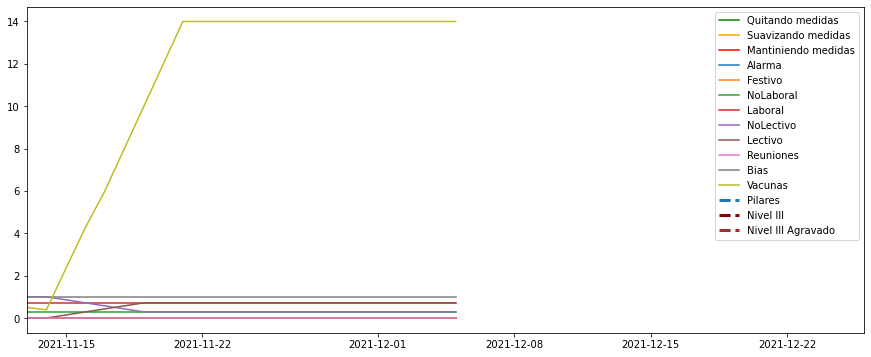

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
#U1.loc['2021-10-12','Festivo']=1
U1.loc['2021-11-1','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
#U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
#U1.loc['2021-10-9':'2021-10-13','Reuniones']=7
#U1.loc['2021-10-15':'2021-10-16','Reuniones']=7
#U1.loc['2021-10-29':'2021-10-30','Reuniones']=7
U1.loc['2021-11-1','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
#U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
#U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U1.loc['2021-11-1','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.86 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-13,144.571429,2187.142857,6.578572,80.364286,56.714286,93.571429,62.644975,19.285714,10.142857,15.000000,...,38.128566,87.510881,88.656624,81.092273,85.892117,88.787726,88.370993,88.994601,90.950105,88.722214
2021-11-14,153.517369,2214.664510,6.786368,79.745934,56.152390,98.750914,62.083668,19.939470,14.372725,15.956145,...,38.125771,87.501714,88.639454,81.087321,85.874593,88.783490,88.373199,88.989030,90.937940,88.701710
2021-11-15,164.246207,2250.788620,7.015294,80.680865,55.632879,105.102250,61.455295,20.641524,18.765976,17.146351,...,38.124390,87.491531,88.625117,81.075214,85.862611,88.773929,88.365094,88.979972,90.926764,88.690060
2021-11-16,176.330045,2302.066516,7.240787,83.004038,55.146875,112.374794,60.864180,21.488688,23.329814,18.630348,...,38.123951,87.480321,88.611643,81.058827,85.849952,88.763187,88.354035,88.969134,90.915116,88.681193
2021-11-17,189.641897,2365.738849,7.469035,86.572237,54.706087,120.517502,60.326411,22.475078,28.111159,20.382693,...,38.124123,87.468169,88.598006,81.038510,85.836102,88.751338,88.341775,88.957715,90.903060,88.672617
2021-11-18,204.155252,2440.240303,7.703514,91.288393,54.319507,129.500432,59.834353,23.601742,33.166179,22.390989,...,38.124811,87.455025,88.583756,81.014223,85.820663,88.738502,88.328715,88.946004,90.890679,88.663635
2021-11-19,219.879911,2524.611579,7.945954,97.065578,53.988284,139.319871,59.376867,24.872288,38.541269,24.648418,...,38.126016,87.440792,88.568710,80.985719,85.803499,88.724716,88.314991,88.933987,90.877948,88.653992
2021-11-20,236.826344,2618.212203,8.196759,103.814263,53.706980,149.982325,58.944501,26.289945,44.265030,27.149236,...,38.127788,87.425362,88.552767,80.952684,85.784542,88.709975,88.300640,88.921564,90.864822,88.643598
2021-11-21,254.945567,2709.616875,8.485113,111.402749,53.483903,161.595251,58.518599,27.755740,50.243437,29.796225,...,38.129590,87.408598,88.536445,80.914559,85.764364,88.693884,88.286054,88.908288,90.850651,88.632027
2021-11-22,274.133412,2799.406520,8.804110,119.800639,53.321285,174.025218,58.084522,29.290389,56.392634,32.597040,...,38.131379,87.390412,88.519424,80.871431,85.742133,88.676713,88.270595,88.894105,90.835751,88.619649


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-13,144.571429,2187.142857,6.578572,80.364286,56.714286,93.571429,62.644975,19.285714,10.142857,15.000000,...,38.128566,87.510881,88.656624,81.092273,85.892117,88.787726,88.370993,88.994601,90.950105,88.722214
2021-11-14,153.521074,2214.737053,6.784512,79.305369,56.052751,98.612981,62.006256,19.895596,14.640678,15.950868,...,38.113004,87.501250,88.641129,81.086266,85.873513,88.782560,88.369814,88.987135,90.937748,88.705610
2021-11-15,164.227022,2249.846793,7.016989,79.939782,55.461977,104.959749,61.365131,20.561307,19.213664,17.137960,...,38.101321,87.490711,88.626854,81.073294,85.861925,88.772819,88.361357,88.977462,90.926366,88.693849
2021-11-16,176.319332,2300.147154,7.240920,80.301173,54.530289,111.698299,60.461358,21.200674,25.007315,18.605552,...,38.040329,87.477417,88.619970,81.051998,85.844724,88.758223,88.336513,88.958898,90.913967,88.700348
2021-11-17,189.581468,2358.789465,7.481813,80.437128,53.297691,119.189444,59.498665,21.804523,31.943921,20.335036,...,37.928955,87.461414,88.614523,81.022394,85.826949,88.741085,88.306392,88.935867,90.900222,88.709819
2021-11-18,204.041452,2422.432022,7.756292,80.751396,51.886493,127.603724,58.558248,22.397520,39.929993,22.348015,...,37.772044,87.443226,88.608134,80.985236,85.806991,88.722289,88.274184,88.911464,90.886065,88.717942
2021-11-19,219.854674,2489.834137,8.072258,81.237458,50.313329,136.905713,57.582474,22.977903,49.166467,24.681104,...,37.562305,87.422598,88.601762,80.939324,85.783047,88.701324,88.237747,88.884982,90.871665,88.727277
2021-11-20,237.203816,2559.807483,8.438948,82.142101,48.632965,147.247482,56.588157,23.577903,59.676570,27.381708,...,37.299387,87.399394,88.594724,80.883662,85.755695,88.678566,88.198525,88.856874,90.856986,88.735989
2021-11-21,256.275119,2621.124846,8.892300,83.682344,46.908912,158.885247,55.567744,24.137441,71.377825,30.412548,...,36.982454,87.373482,88.587447,80.817074,85.725198,88.653720,88.157220,88.827039,90.841545,88.743405
2021-11-22,277.247310,2675.121373,9.430645,86.174741,45.189567,171.861876,54.514747,24.724008,84.207059,33.844059,...,36.611184,87.344729,88.579629,80.738916,85.690535,88.627093,88.113359,88.795561,90.825758,88.749863


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-13,144.571429,2187.142857,6.578572,80.364286,56.714286,93.571429,62.644975,19.285714,10.142857,15.000000,...,38.128566,87.510881,88.656624,81.092273,85.892117,88.787726,88.370993,88.994601,90.950105,88.722214
2021-11-14,153.521074,2214.737053,6.784512,79.305369,56.052751,98.612981,62.006256,19.895596,14.640678,15.950868,...,38.113004,87.501250,88.641129,81.086266,85.873513,88.782560,88.369814,88.987135,90.937748,88.705610
2021-11-15,164.227022,2249.846793,7.016989,79.939782,55.461977,104.959749,61.365131,20.561307,19.213664,17.137960,...,38.101321,87.490711,88.626854,81.073294,85.861925,88.772819,88.361357,88.977462,90.926366,88.693849
2021-11-16,176.317200,2300.105415,7.241988,80.554662,54.587618,111.777662,60.505899,21.225918,24.853142,18.608589,...,38.047674,87.477684,88.619007,81.052605,85.845346,88.758758,88.338460,88.959989,90.914078,88.698104
2021-11-17,189.589912,2359.280575,7.482137,81.172003,53.465789,119.368015,59.604746,21.881397,31.498717,20.343559,...,37.951166,87.462210,88.612351,81.024237,85.828100,88.742375,88.310912,88.938638,90.900586,88.704908
2021-11-18,204.066737,2424.307176,7.752180,82.149176,52.207978,127.881010,58.734324,22.552055,39.062651,22.360056,...,37.816713,87.444758,88.604697,80.988891,85.808821,88.724494,88.281686,88.916202,90.886711,88.710254
2021-11-19,219.885105,2494.075552,8.058593,83.428735,50.819572,137.269290,57.834509,23.233754,47.747200,24.687926,...,37.637073,87.425053,88.597053,80.945420,85.785787,88.704575,88.248554,88.891861,90.872578,88.716808
2021-11-20,237.200825,2567.435806,8.409479,85.206247,49.345497,147.670910,56.921295,23.954471,57.574749,27.366375,...,37.411937,87.402959,88.588740,80.892920,85.759609,88.682973,88.212914,88.866024,90.858135,88.722771
2021-11-21,256.165423,2633.120141,8.839853,87.648071,47.841156,159.322737,55.986507,24.648322,68.460579,30.349135,...,37.140508,87.378349,88.580175,80.830319,85.730569,88.659383,88.175443,88.838567,90.842885,88.727474
2021-11-22,276.916155,2692.349635,9.347317,91.020856,46.348438,172.242509,55.022772,25.375847,80.338249,33.697360,...,36.822503,87.351097,88.571048,80.757081,85.697665,88.634107,88.135650,88.809567,90.827234,88.731246


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-13,144.571429,2187.142857,6.578572,80.364286,56.714286,93.571429,62.644975,19.285714,10.142857,15.000000,...,38.128566,87.510881,88.656624,81.092273,85.892117,88.787726,88.370993,88.994601,90.950105,88.722214
2021-11-14,153.521074,2214.737053,6.784512,79.305369,56.052751,98.612981,62.006256,19.895596,14.640678,15.950868,...,38.113004,87.501250,88.641129,81.086266,85.873513,88.782560,88.369814,88.987135,90.937748,88.705610
2021-11-15,164.227022,2249.846793,7.016989,79.939782,55.461977,104.959749,61.365131,20.561307,19.213664,17.137960,...,38.101321,87.490711,88.626854,81.073294,85.861925,88.772819,88.361357,88.977462,90.926366,88.693849
2021-11-16,176.321464,2300.188893,7.239852,80.047683,54.472960,111.618936,60.416818,21.175430,25.161488,18.602516,...,38.032984,87.477150,88.620934,81.051391,85.844102,88.757688,88.334566,88.957808,90.913857,88.702592
2021-11-17,189.573024,2358.298355,7.481488,79.702253,53.129594,119.010874,59.392584,21.727648,32.389125,20.326513,...,37.906743,87.460617,88.616695,81.020552,85.825798,88.739795,88.301873,88.933096,90.899859,88.714730
2021-11-18,204.016167,2420.556867,7.760405,79.353617,51.565008,127.326439,58.382171,22.242986,40.797336,22.335974,...,37.727375,87.441695,88.611571,80.981582,85.805161,88.720083,88.266681,88.906726,90.885420,88.725631
2021-11-19,219.824243,2485.592722,8.085922,79.046180,49.807086,136.542135,57.330440,22.722051,50.585734,24.674281,...,37.487537,87.420144,88.606471,80.933227,85.780307,88.698072,88.226940,88.878102,90.870751,88.737745
2021-11-20,237.206806,2552.179160,8.468417,79.077954,47.920434,146.824054,56.255019,23.201334,61.778391,27.397042,...,37.186838,87.395829,88.600709,80.874403,85.751781,88.674159,88.184136,88.847724,90.855837,88.749207
2021-11-21,256.384816,2609.129551,8.944748,79.716616,45.976668,158.447756,55.148981,23.626559,74.295071,30.475960,...,36.824401,87.368615,88.594719,80.803829,85.719827,88.648058,88.138997,88.815510,90.840204,88.759336
2021-11-22,277.578464,2657.893111,9.513973,81.328626,44.030697,171.481243,54.006721,24.072168,88.075869,33.990758,...,36.399865,87.338361,88.588211,80.720751,85.683404,88.620080,88.091068,88.781556,90.824283,88.768479


CPU times: user 76 ms, sys: 2.59 ms, total: 78.6 ms
Wall time: 78 ms


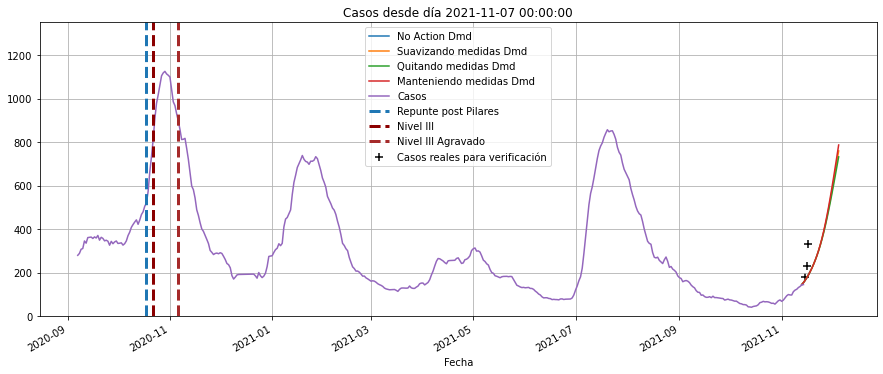

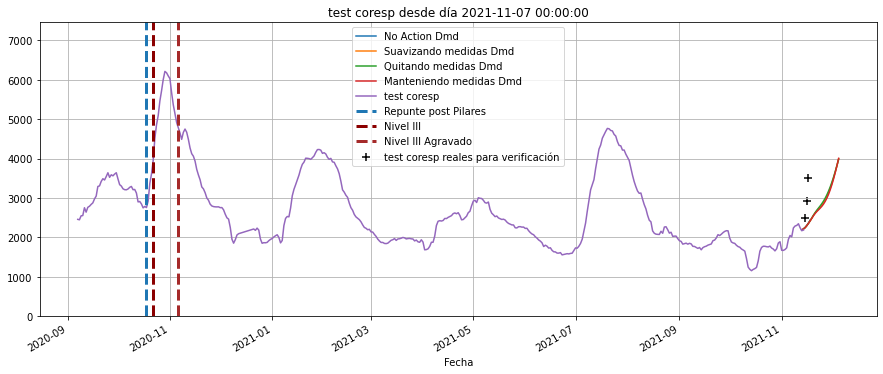

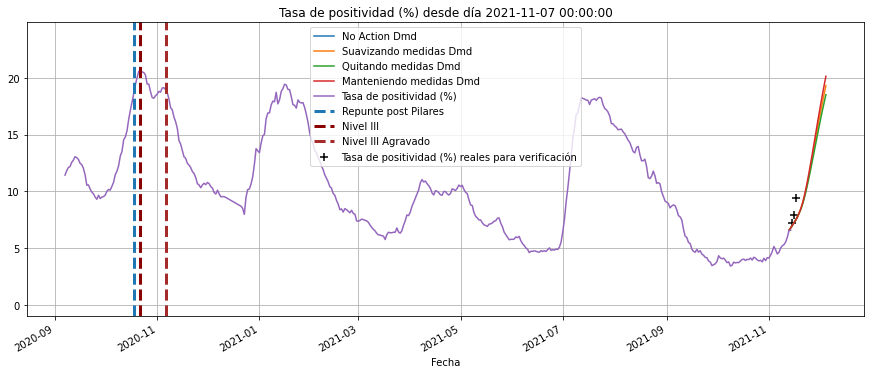

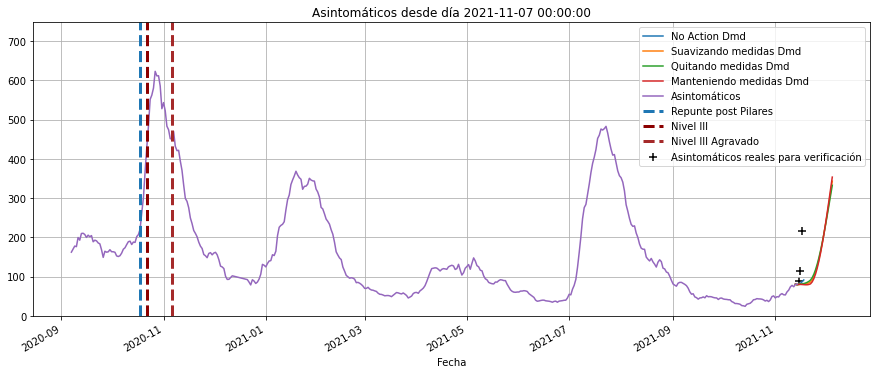

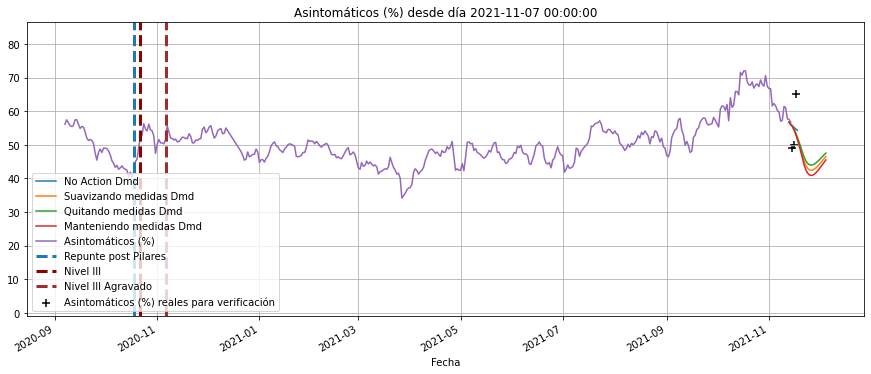

...

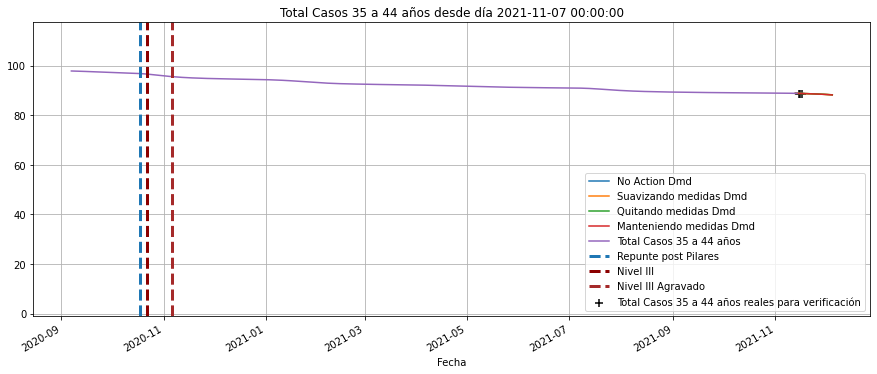

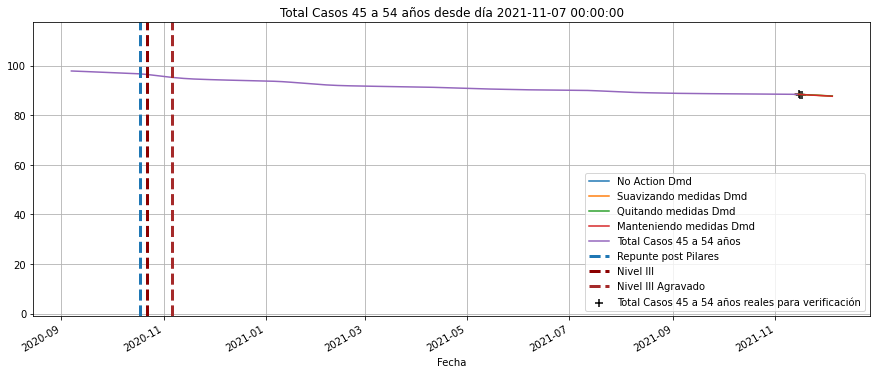

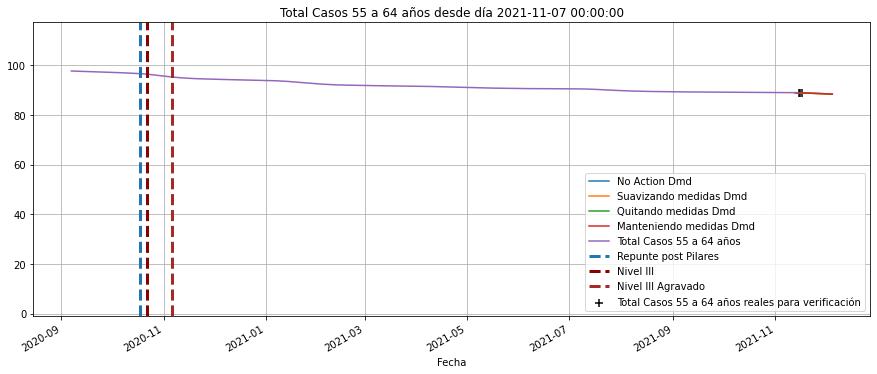

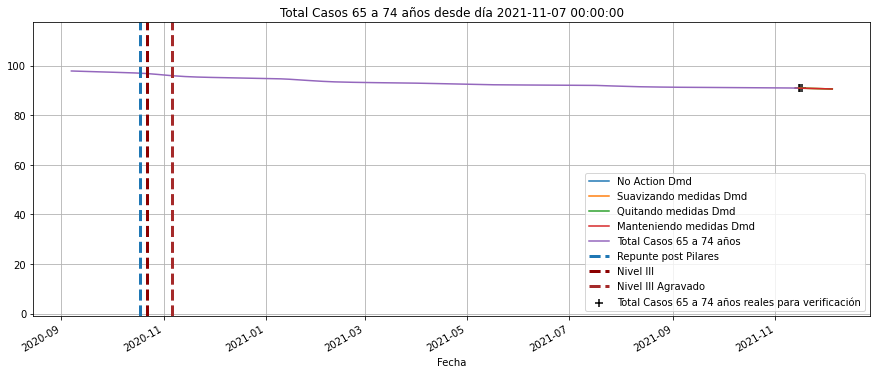

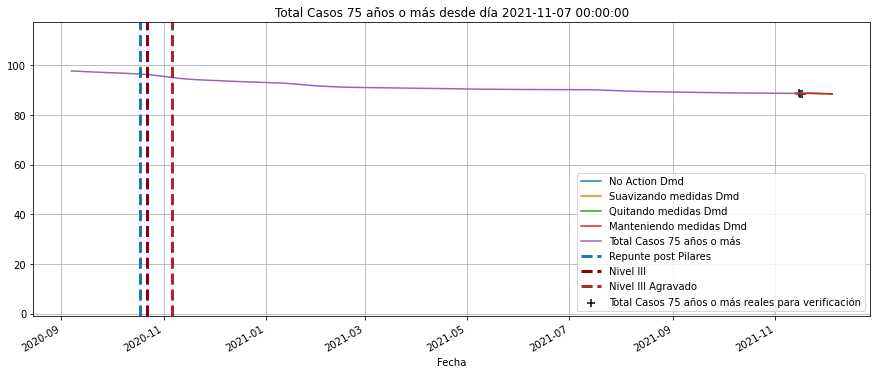

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

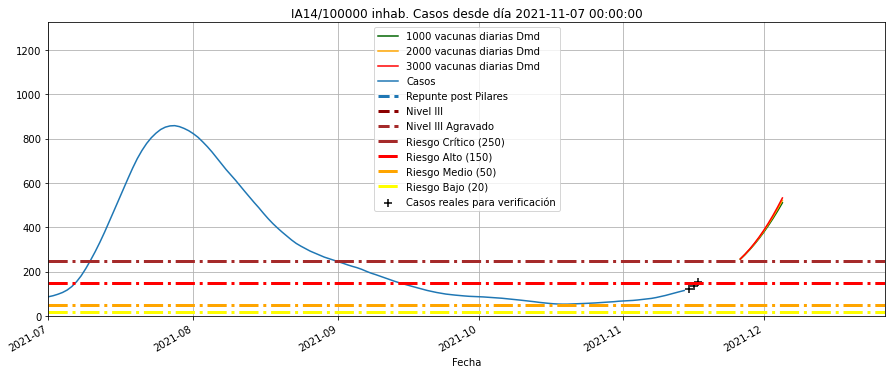

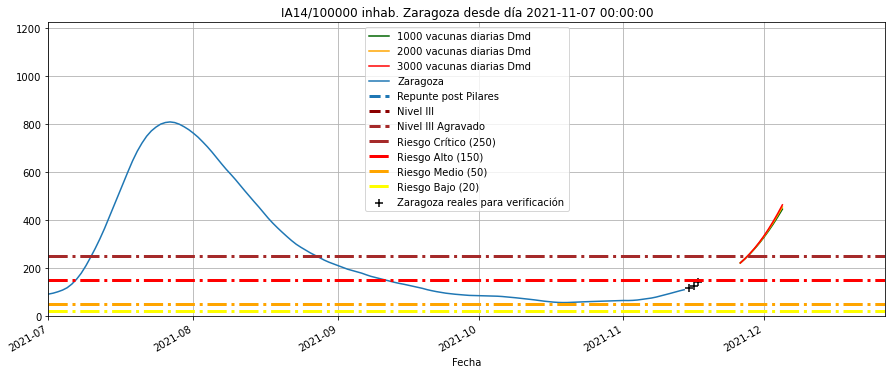

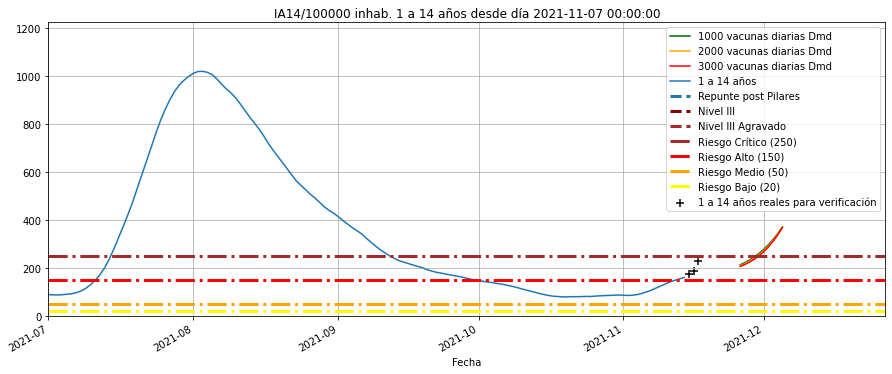

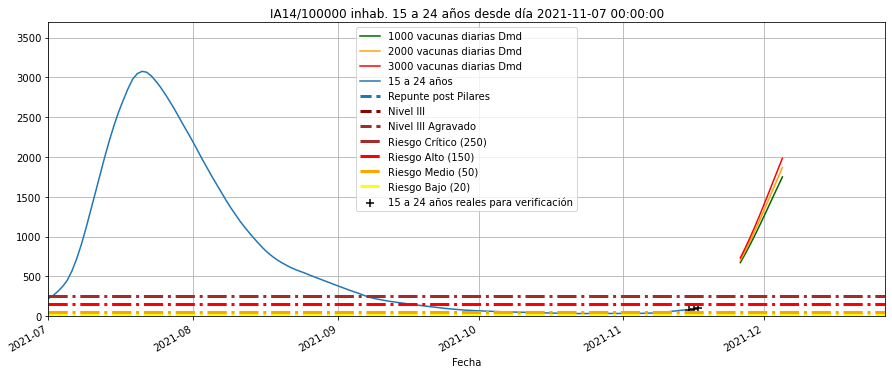

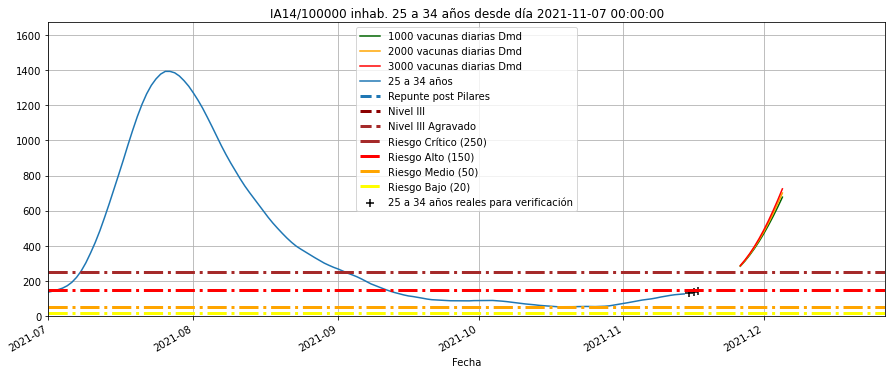

...

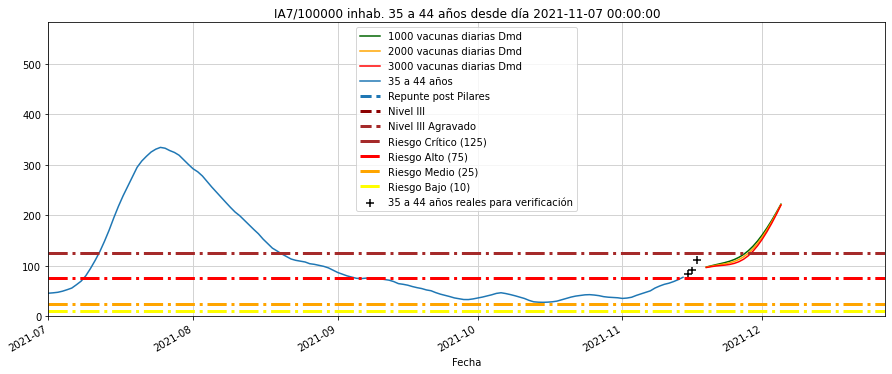

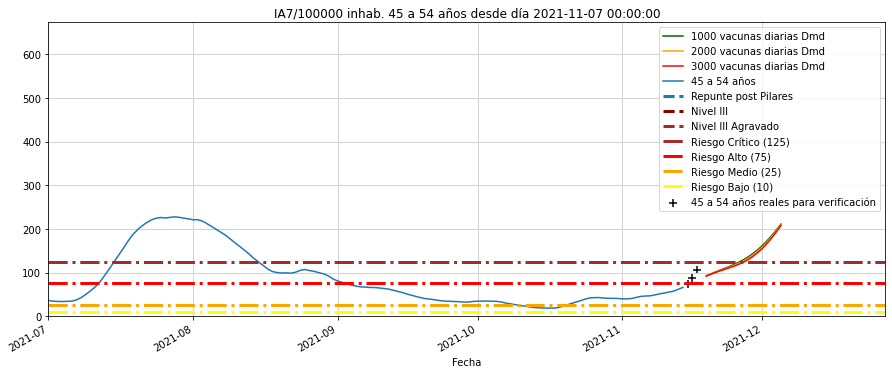

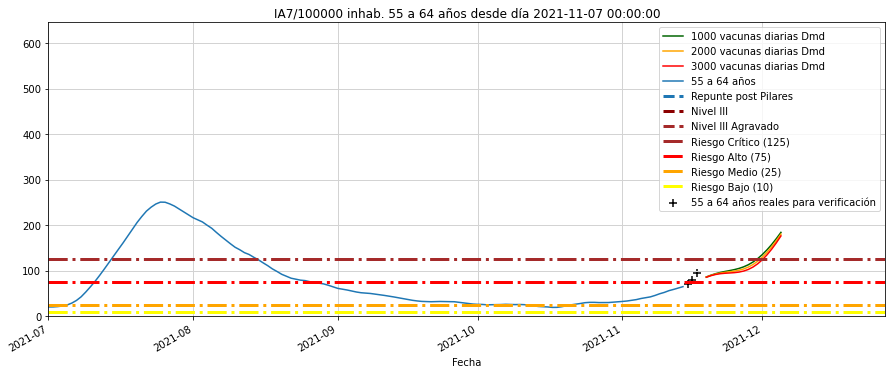

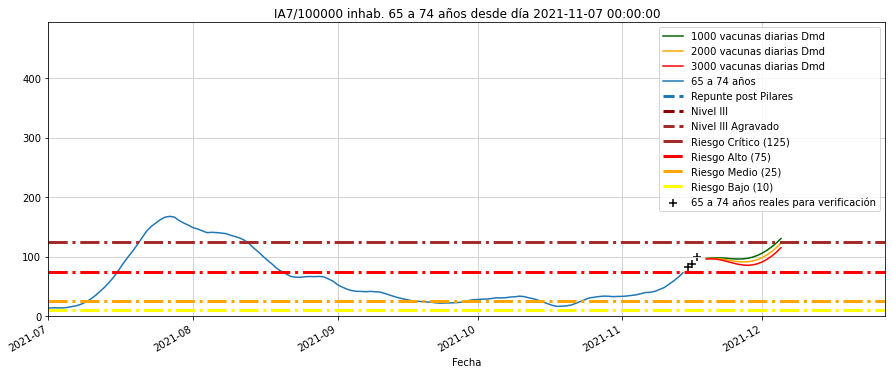

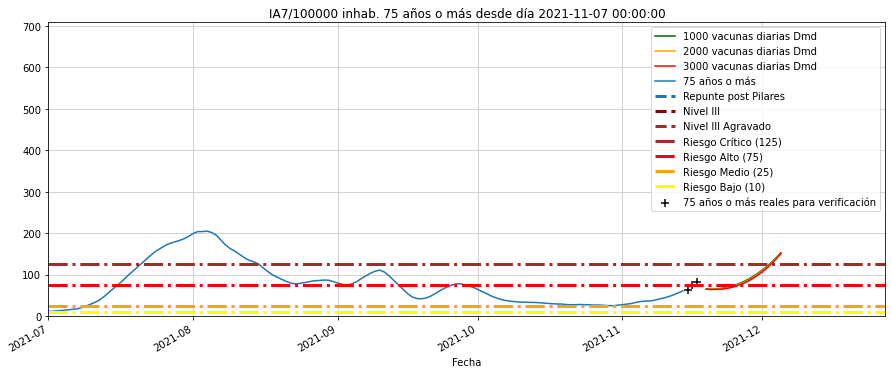

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-15,1,180.0,2482.0,0.0,7.25,88.20,92.0,29.0,7.0,17.0,...,NaN,87.466668,88.613316,81.068225,85.851425,88.734549,88.322797,88.950485,90.898017,88.686853
2021-11-16,2,230.0,2919.0,0.0,7.88,115.00,149.0,33.0,17.0,20.0,...,NaN,87.449234,88.595434,81.054501,85.837312,88.717099,88.301455,88.931256,90.884702,88.667573
2021-11-17,3,331.0,3501.0,0.0,9.45,215.15,209.0,78.0,13.0,28.0,...,NaN,87.424145,88.553167,81.044006,85.817553,88.686686,88.273323,88.907504,90.863249,88.654277
2021-11-18,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

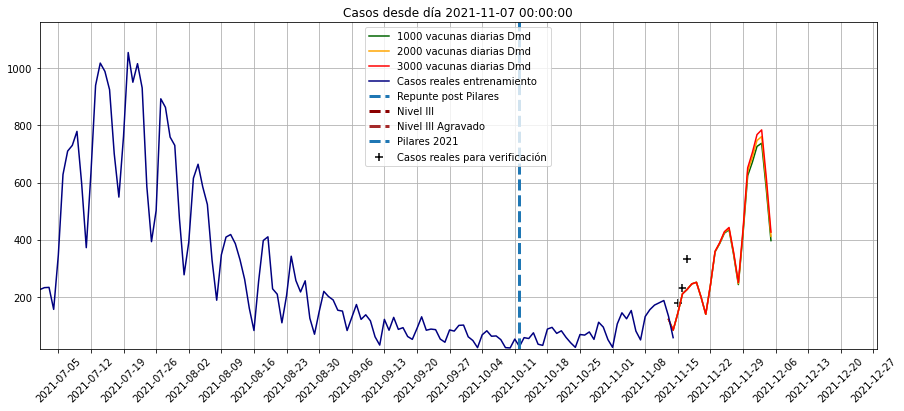

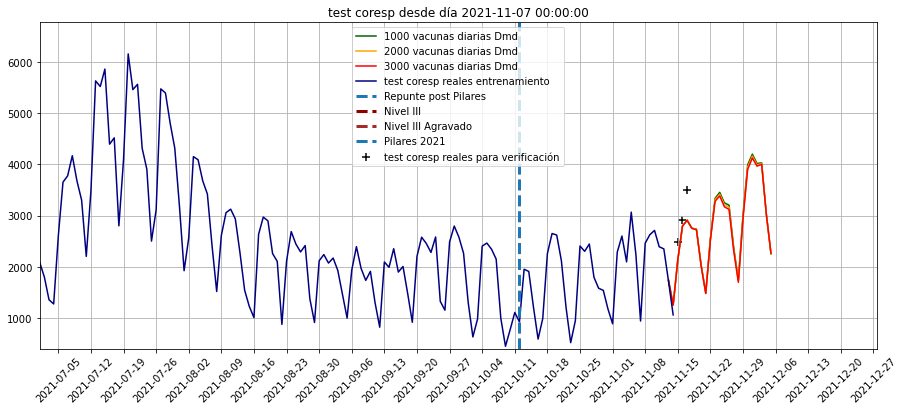

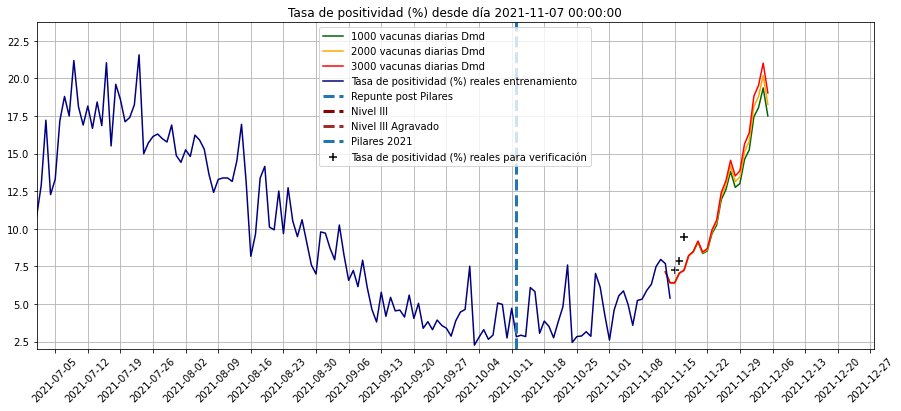

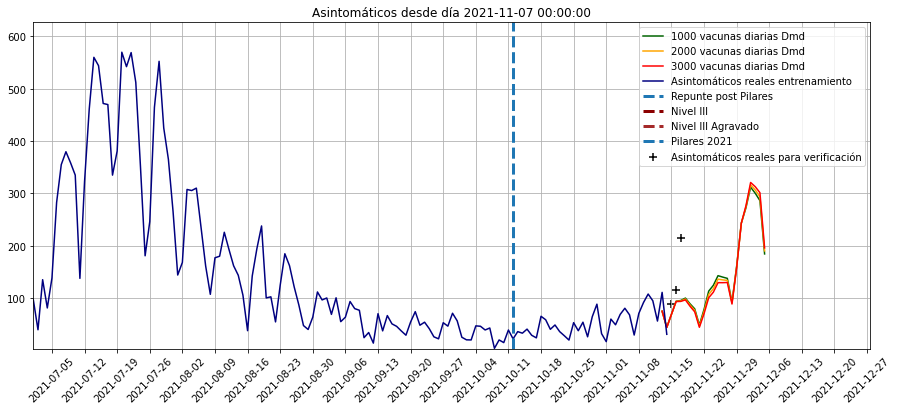

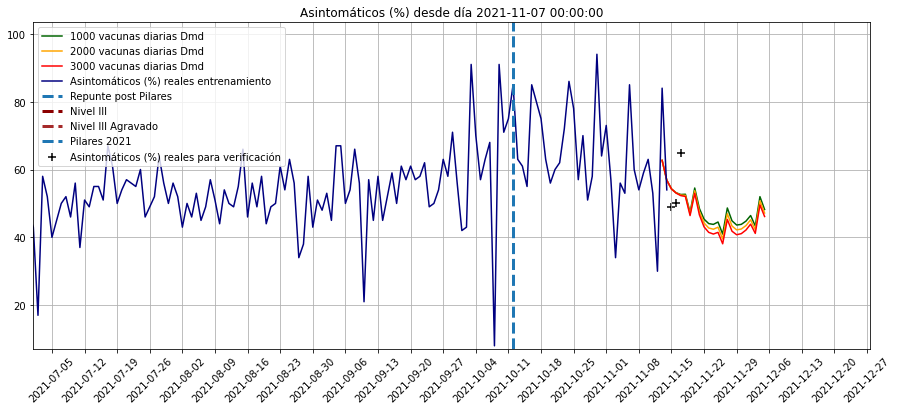

...

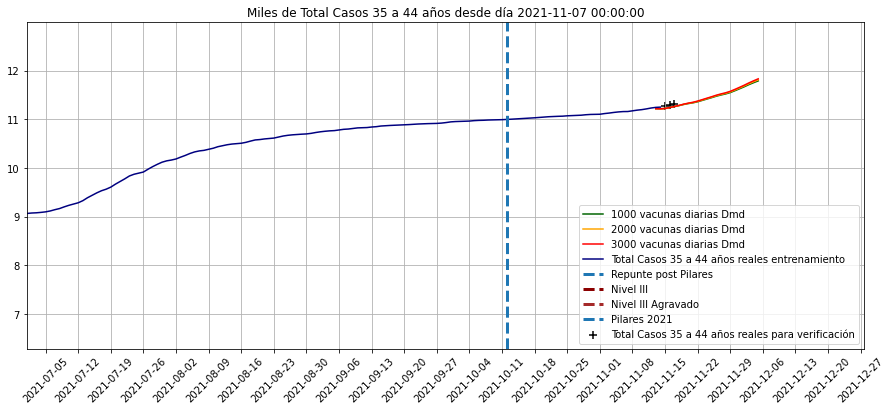

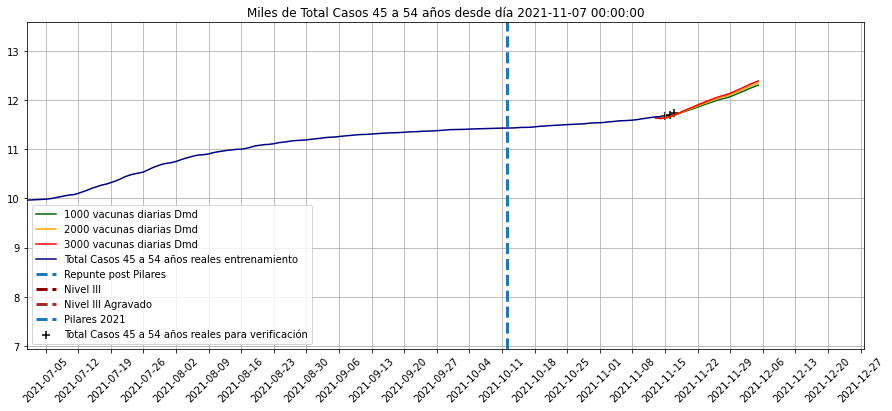

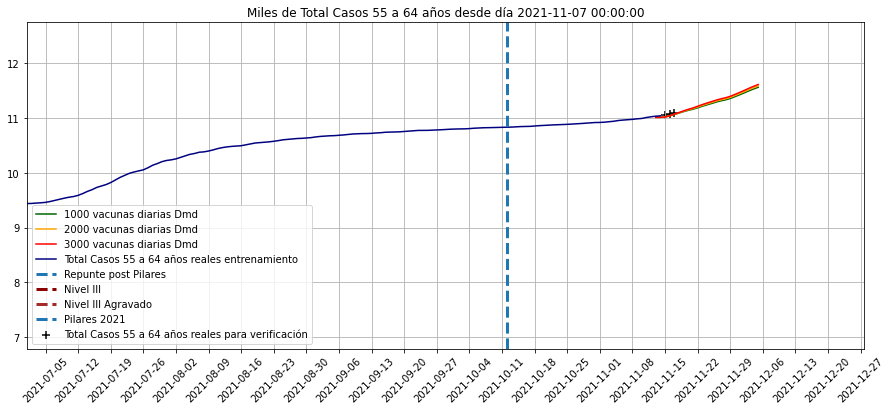

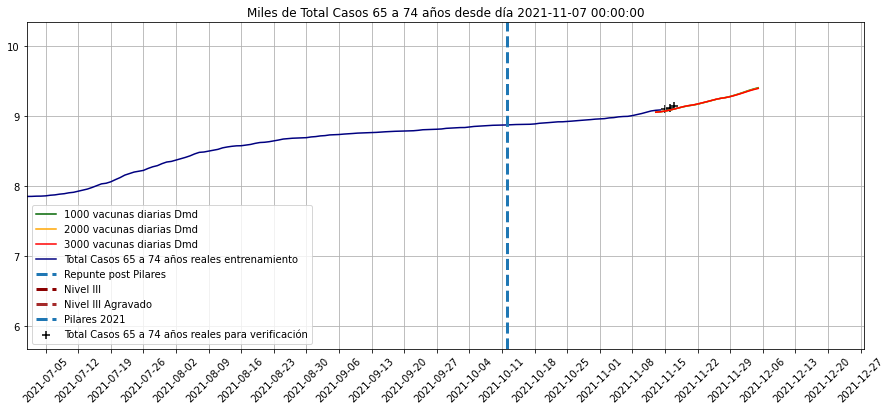

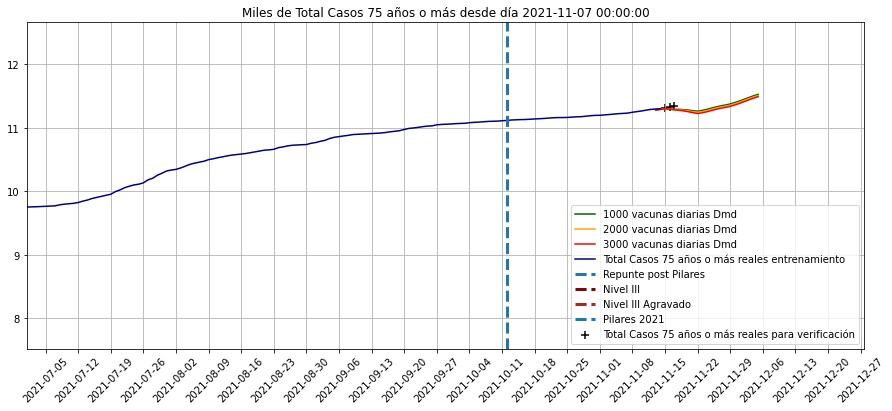

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-15':'2021-11-21'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-15':'2021-11-21'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-11-21,139,1480,0,8,48,85,21,105,138,1216,11,35,16,16,19,14,10,9
2021-11-20,198,2028,0,9,54,129,20,96,131,1227,21,48,22,24,27,20,16,13
2021-11-19,251,2728,0,8,47,157,20,95,127,1212,27,58,29,34,35,25,21,16
2021-11-18,245,2752,0,8,52,154,20,94,128,1108,27,51,27,33,35,29,23,16
2021-11-17,226,2910,0,7,52,144,19,96,125,1083,27,40,24,34,33,27,23,15
2021-11-16,210,2795,0,7,53,134,19,97,122,1083,27,29,22,35,33,28,22,16
2021-11-15,142,2135,0,6,54,83,18,99,119,1112,15,16,15,24,24,18,16,12


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-11-13,120.938256,1732.360718,7.131102,74.913586,62.693167,82.151573,65.640230,17.290178,8.128903,12.316550,...,87.510881,88.650209,81.082739,85.886301,88.783866,88.366838,88.991095,90.946846,88.718356,0.0
2021-11-14,83.200302,1250.857005,6.411083,43.966189,56.852781,53.064924,61.668623,8.927756,7.185685,8.330551,...,87.501250,88.644641,81.092642,85.878373,88.786769,88.374196,88.991048,90.940173,88.707357,0.0
2021-11-15,142.384881,2134.974136,6.402273,68.944838,54.282248,83.348192,56.449913,15.288133,15.761930,14.743399,...,87.490711,88.635818,81.087747,85.871189,88.780357,88.368523,88.984204,90.930719,88.698727,0.0
2021-11-16,210.362963,2794.509527,7.051896,93.653220,53.102371,133.610061,60.364597,26.526016,28.824868,22.013983,...,87.477417,88.624928,81.061107,85.849462,88.761407,88.340084,88.961686,90.916757,88.703532,0.0
2021-11-17,225.843834,2909.659344,7.237423,94.506849,52.470206,143.886947,60.282028,26.894769,40.267537,24.246084,...,87.461414,88.615038,81.023312,85.827232,88.740323,88.305965,88.935097,90.900809,88.711342,0.0


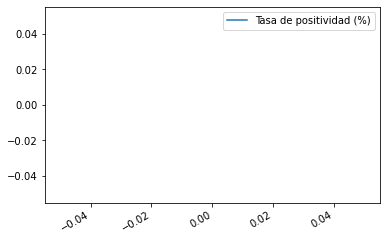

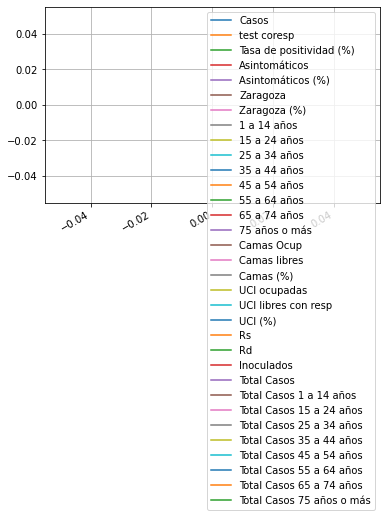

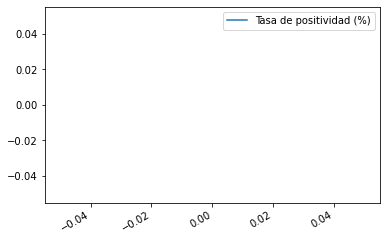

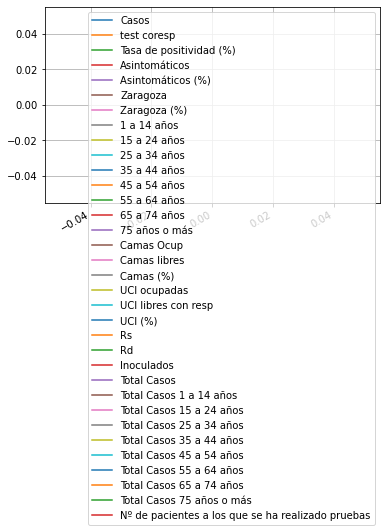

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-11-10     6.309963
2021-11-11     7.489540
2021-11-12     7.964225
2021-11-13     7.683353
2021-11-14     5.392621
Length: 410, dtype: float64

<AxesSubplot:xlabel='Fecha'>

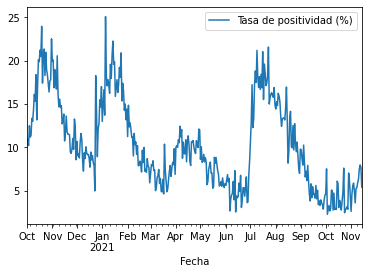

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,3.0,-44.139987,23.111470,-65.519527,-56.400914,-47.282300,-33.450217,-19.618135
15 a 24 años,3.0,134.826252,70.593144,69.558047,97.364237,125.170426,167.460355,209.750284
25 a 34 años,3.0,-5.537016,13.516162,-13.406842,-13.340482,-13.274123,-1.602104,10.069915
35 a 44 años,3.0,-24.875723,23.420135,-44.409774,-37.857358,-31.304942,-15.108697,1.087549
45 a 54 años,3.0,-31.226600,9.573511,-42.244607,-34.369926,-26.495244,-25.717596,-24.939947
55 a 64 años,3.0,-24.239592,8.940723,-34.532984,-27.156116,-19.779248,-19.092896,-18.406544
65 a 74 años,3.0,-8.710620,24.936725,-26.252635,-22.983598,-19.714560,0.060387,19.835335
75 años o más,3.0,-31.311950,11.432678,-44.370525,-35.414946,-26.459366,-24.782663,-23.105959
Asintomáticos,3.0,-32.155880,20.778058,-56.073972,-38.952611,-21.831249,-20.196833,-18.562417
Asintomáticos (%),3.0,-0.763922,16.194847,-19.276606,-6.535931,6.204743,8.492420,10.780097


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-11-15    0.0
2021-11-16    0.0
2021-11-17    0.0
2021-11-18    NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

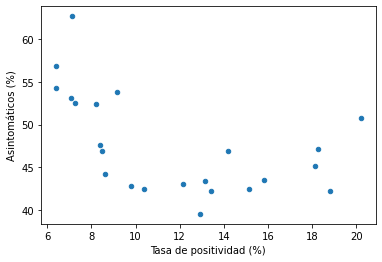

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

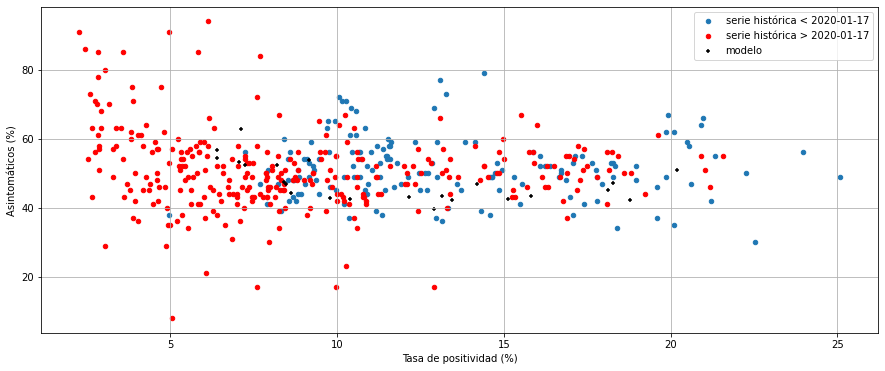

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-11-09,2021-11-10,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,155.000000,171.000000,1.790000e+02,187.000000,132.000000,57.000000,180.000000,230.000000,331.000000,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2626.000000,2710.000000,2.390000e+03,2348.000000,1718.000000,1057.000000,2482.000000,2919.000000,3501.000000,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,5.900000,6.310000,7.490000e+00,7.960000,7.680000,5.390000,7.250000,7.880000,9.450000,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,91.450000,107.730000,9.487000e+01,56.100000,110.880000,30.780000,88.200000,115.000000,215.150000,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,108.000000,104.000000,1.070000e+02,142.000000,97.000000,25.000000,92.000000,149.000000,209.000000,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,23.000000,33.000000,1.600000e+01,24.000000,20.000000,4.000000,29.000000,33.000000,78.000000,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,14.000000,15.000000,1.400000e+01,11.000000,6.000000,0.000000,7.000000,17.000000,13.000000,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,19.000000,18.000000,1.600000e+01,19.000000,14.000000,6.000000,17.000000,20.000000,28.000000,NaN


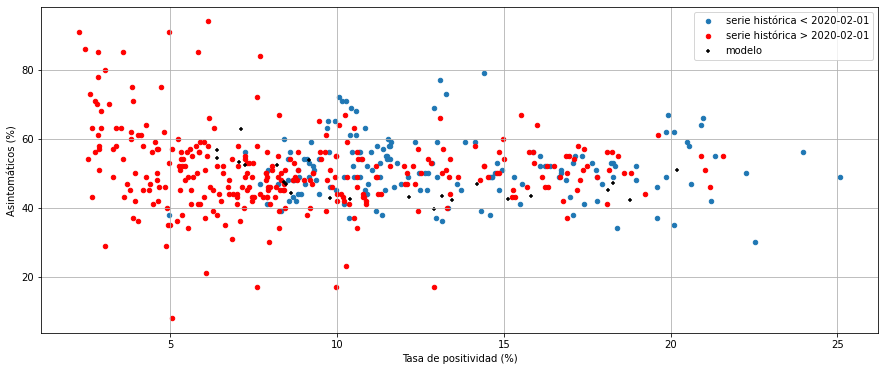

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,-0.086259
Asintomáticos (%),-0.086259,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

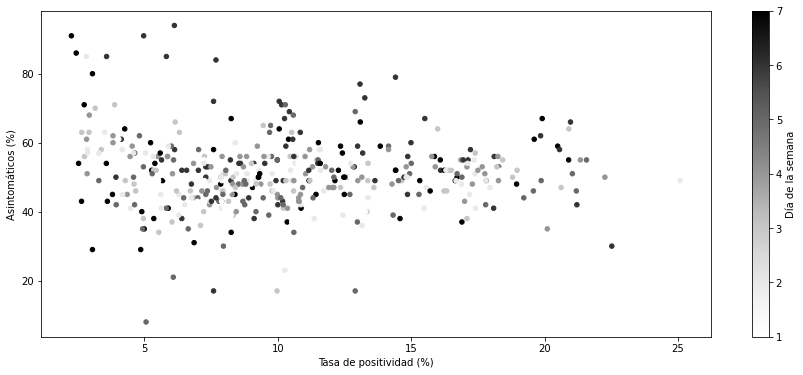

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20,2021-11-21,2021-11-22,...,2021-11-26,2021-11-27,2021-11-28,2021-11-29,2021-11-30,2021-12-01,2021-12-02,2021-12-03,2021-12-04,2021-12-05
Casos,120.938256,83.200302,142.384881,210.362963,225.843834,245.167010,250.723831,198.427976,138.887560,240.373507,...,438.858942,350.020418,246.406679,427.785844,637.568006,687.700143,746.996817,760.855729,596.665048,411.577859
test coresp,1732.360718,1250.857005,2134.974136,2794.509527,2909.659344,2752.163707,2727.940733,2027.535565,1480.379971,2538.535050,...,3162.128513,2342.566901,1717.664648,2978.280462,3948.440061,4163.711226,3992.600919,4015.696397,3030.827245,2256.909433
Tasa de positividad (%),7.131102,6.411083,6.402273,7.051896,7.237423,8.210293,8.480744,9.147730,8.402856,8.604483,...,12.899922,14.181703,13.135218,13.431709,15.132048,15.808163,18.130731,18.796613,20.191822,18.269426
Asintomáticos,74.913586,43.966189,68.944838,93.653220,94.506849,98.250771,86.652793,76.570820,46.392744,74.322239,...,134.757250,133.718475,90.365769,159.328652,243.017379,274.434092,316.356259,306.452890,293.704027,190.129656
Asintomáticos (%),62.693167,56.852781,54.282248,53.102371,52.470206,52.377120,46.889987,53.759905,47.578433,44.228342,...,39.529461,46.958989,43.338695,42.196995,42.456274,43.462576,45.159817,42.255645,50.782114,47.178689
Zaragoza,82.151573,53.064924,83.348192,133.610061,143.886947,154.410977,157.156445,129.276773,85.498212,136.474952,...,277.649270,231.536167,154.617606,248.254162,406.040916,443.779368,480.201911,489.970533,401.470289,262.502541
Zaragoza (%),65.640230,61.668623,56.449913,60.364597,60.282028,59.230722,58.374815,59.293816,55.265169,50.148230,...,52.531476,53.711820,50.479079,46.277059,49.833829,50.224897,49.839304,49.680375,51.088177,48.248252
1 a 14 años,17.290178,8.927756,15.288133,26.526016,26.894769,27.199512,27.206682,21.138244,10.831200,18.383263,...,36.202122,29.759697,16.298038,29.699170,55.099182,59.904595,64.950172,69.541407,57.604614,31.402281
15 a 24 años,8.128903,7.185685,15.761930,28.824868,40.267537,50.722579,57.901843,47.827258,35.032433,69.079264,...,159.751444,118.975894,79.076601,142.391026,214.102844,249.036837,265.398841,258.821353,184.347258,117.592909
25 a 34 años,12.316550,8.330551,14.743399,22.013983,24.246084,26.936653,29.106621,22.483212,15.883354,29.115278,...,62.169295,48.215056,34.028133,61.902937,93.533360,102.969832,113.060882,119.454330,89.296051,60.635025


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

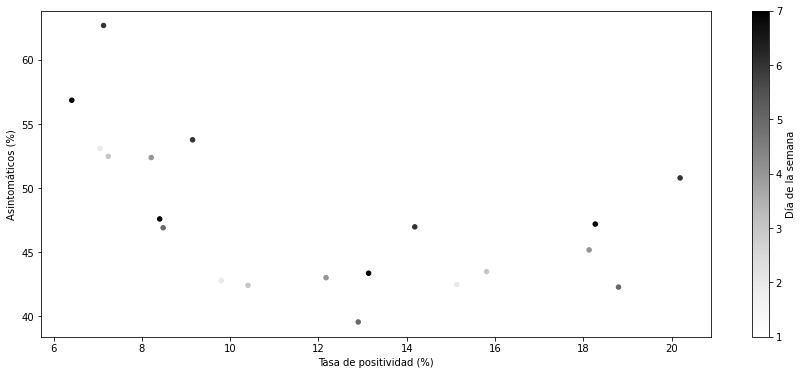

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

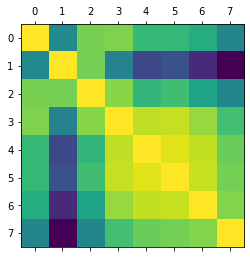

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

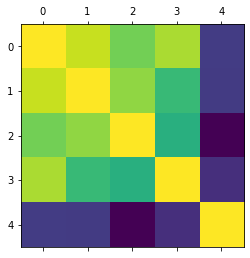

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

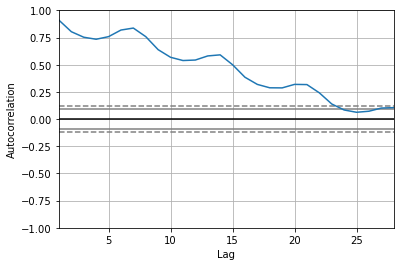

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

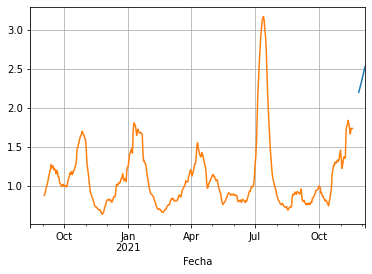

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

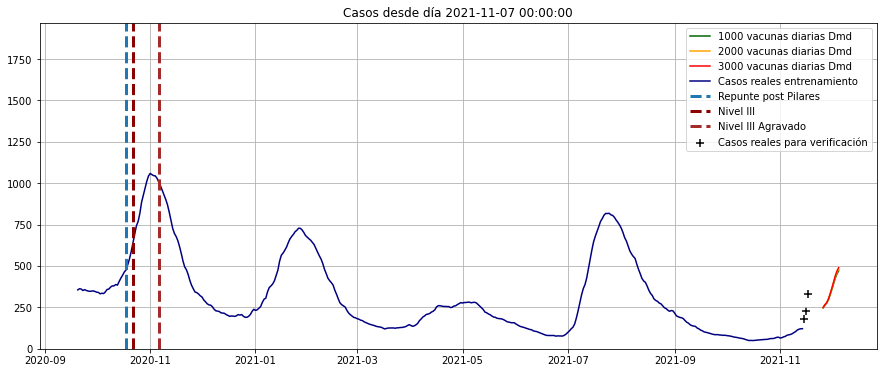

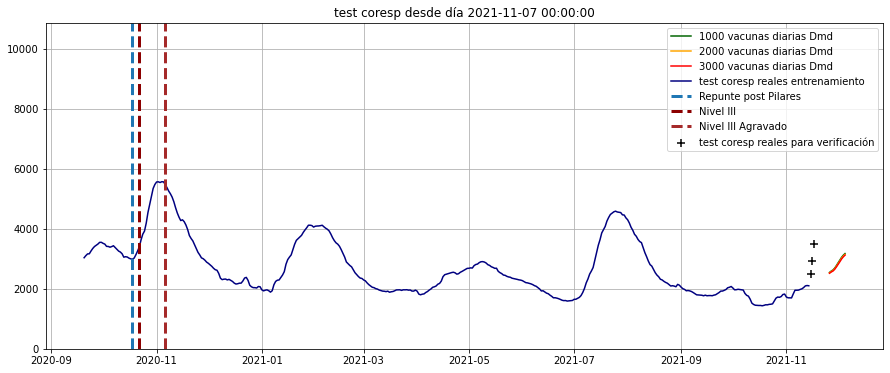

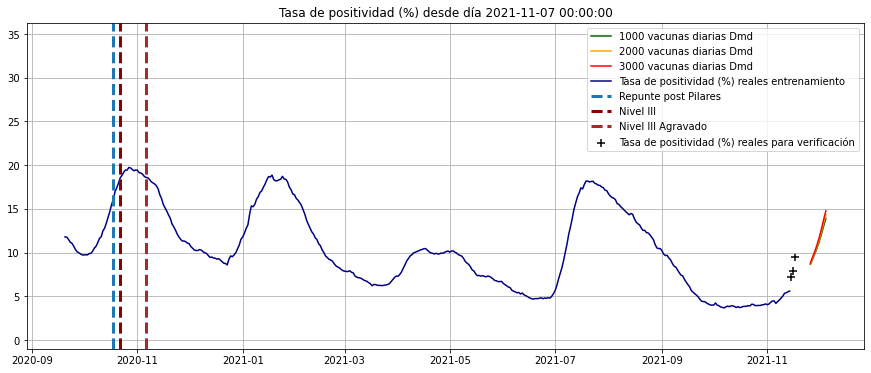

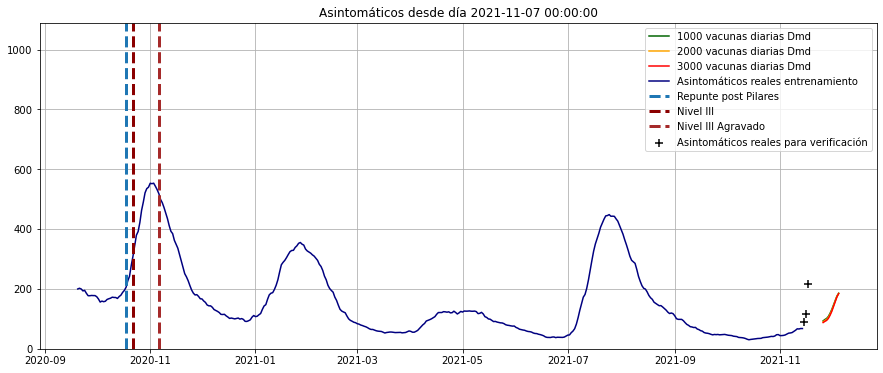

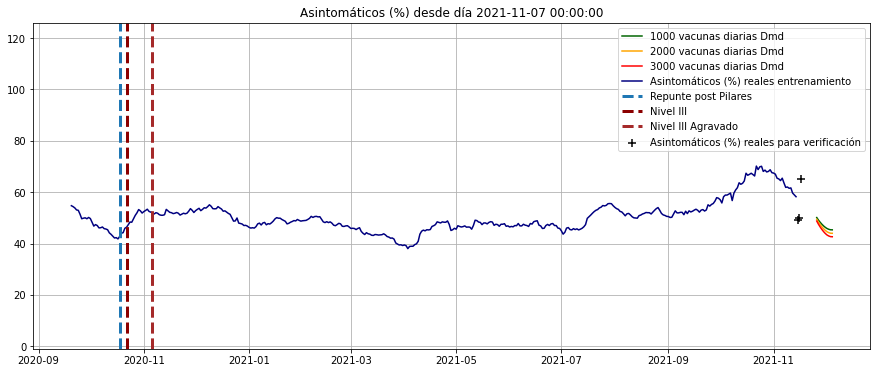

...

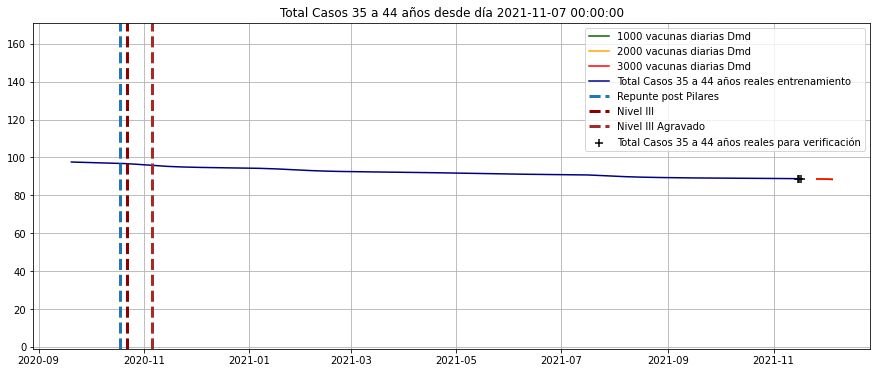

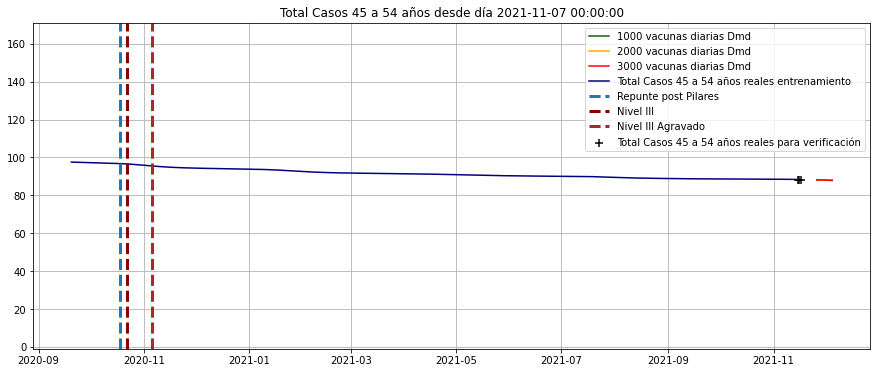

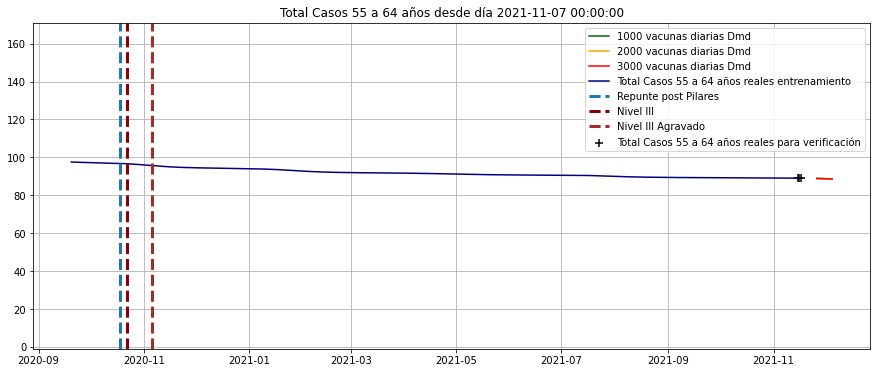

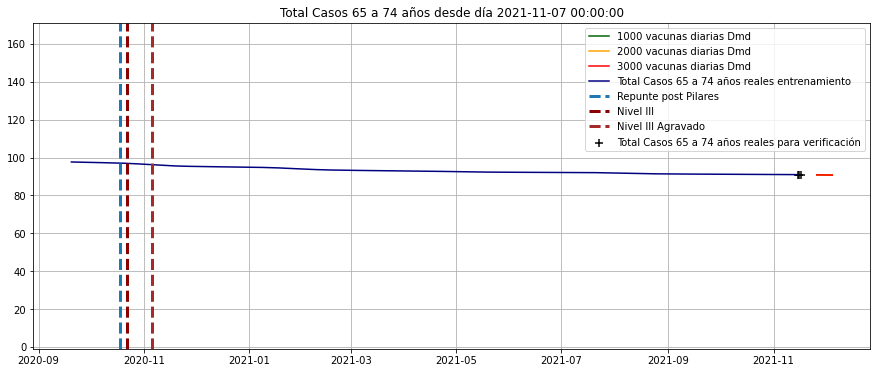

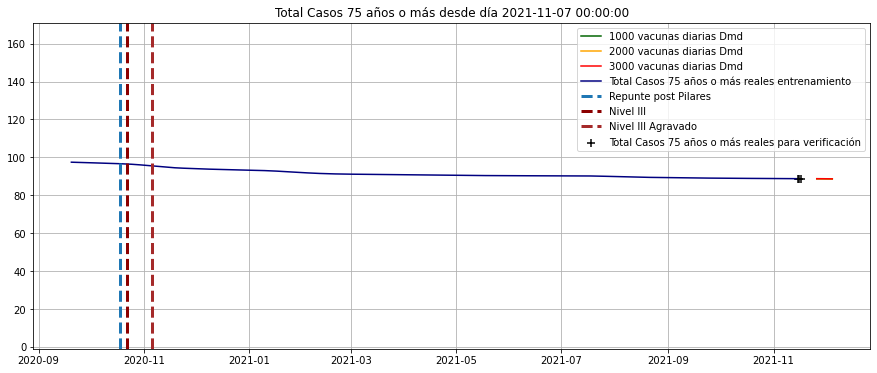

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

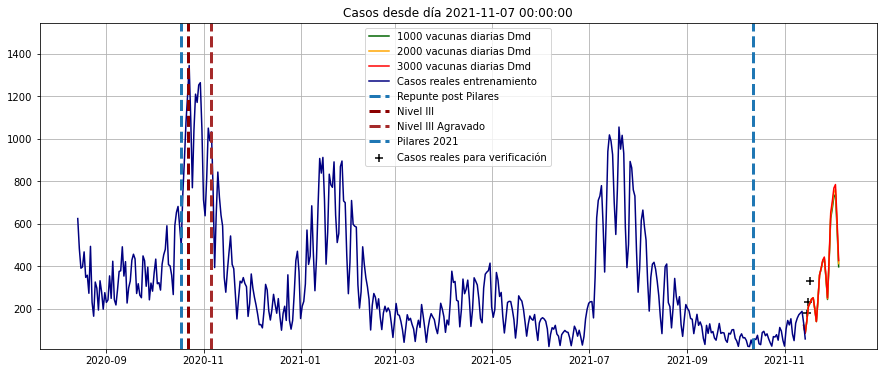

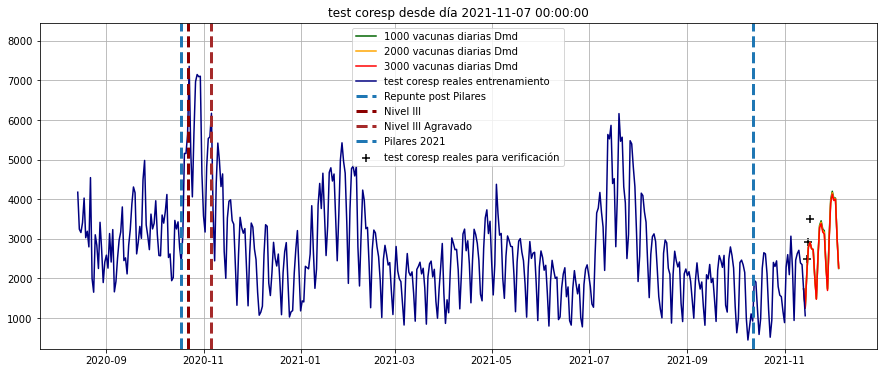

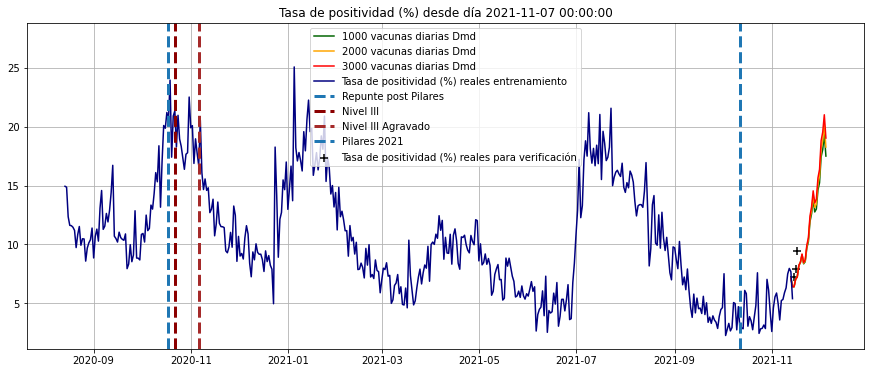

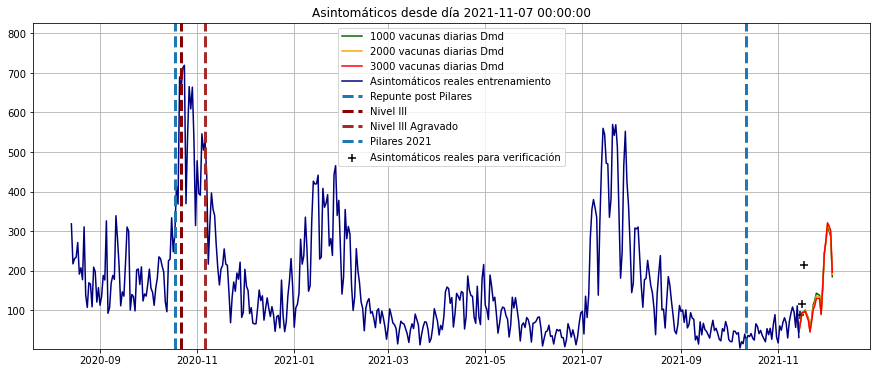

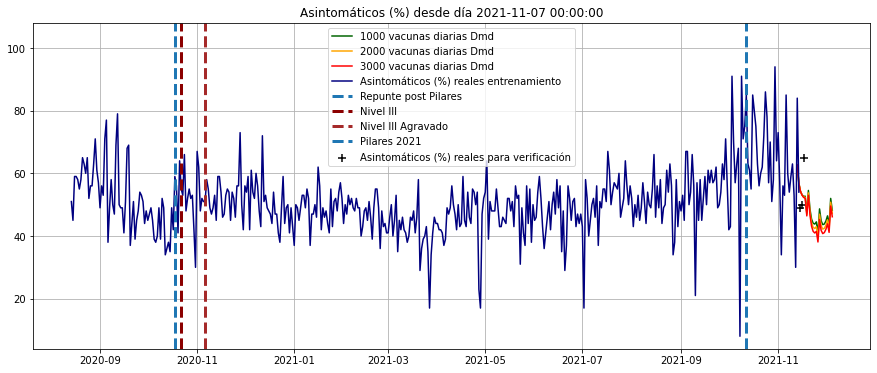

...

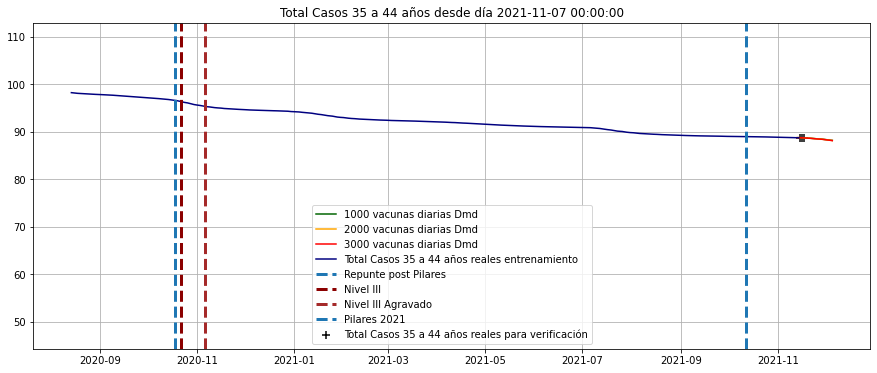

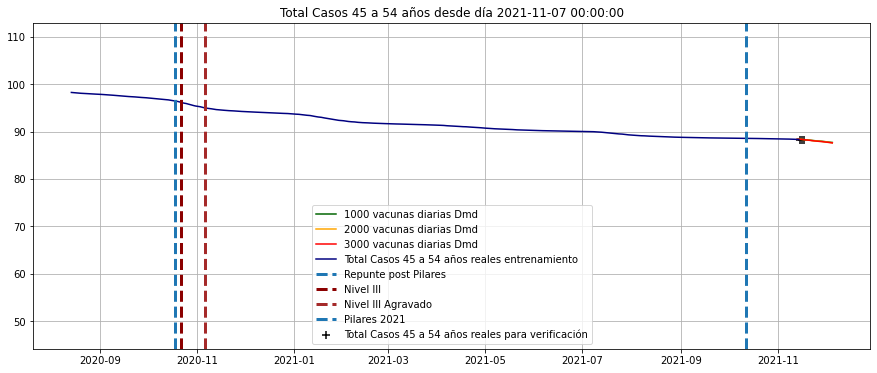

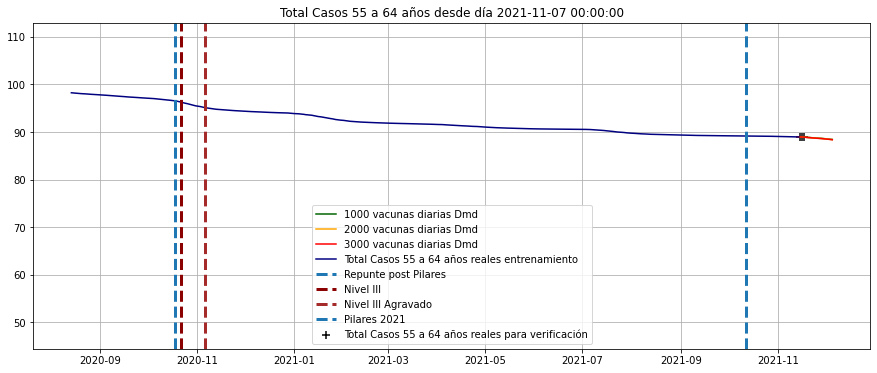

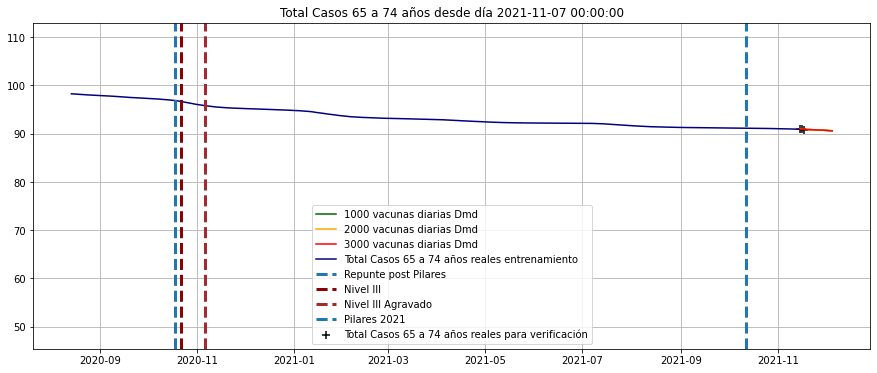

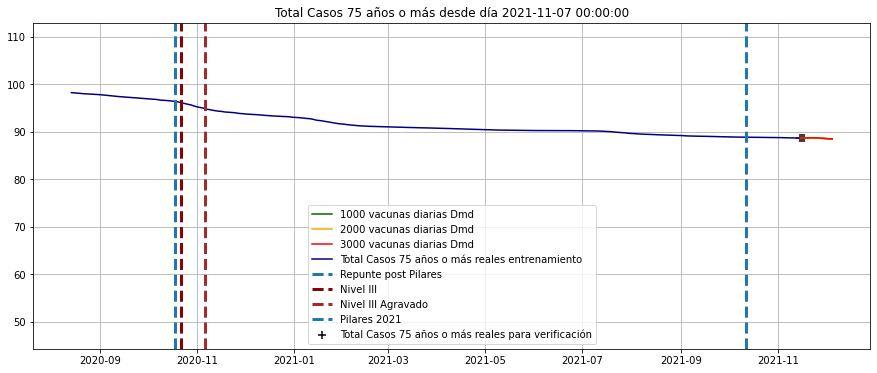

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-11-16
Casos,230.0
test coresp,2919.0
Asintomáticos (%),50.0


Fecha,2021-11-17
Casos,241.39418


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-11-13,132.0,189.277186
2021-11-14,57.0,173.555630
2021-11-15,180.0,90.454347


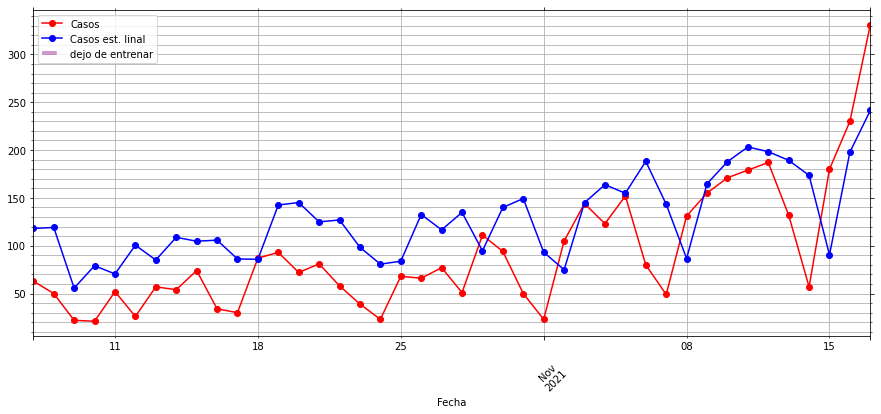

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

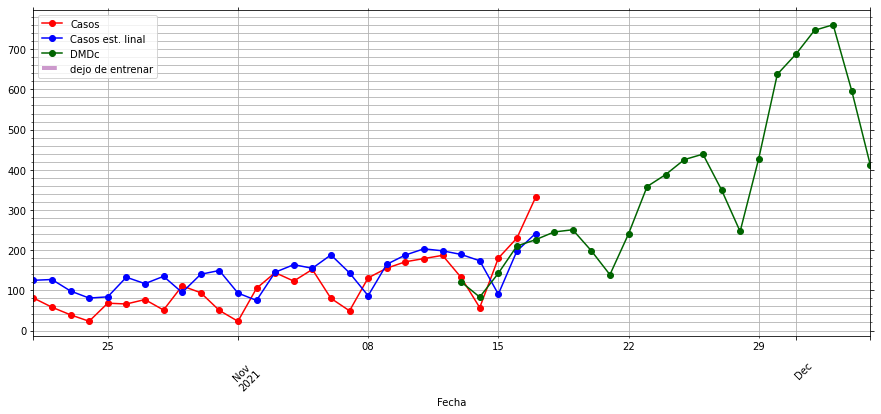

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(13.0998101562925, 114.59557606215384)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

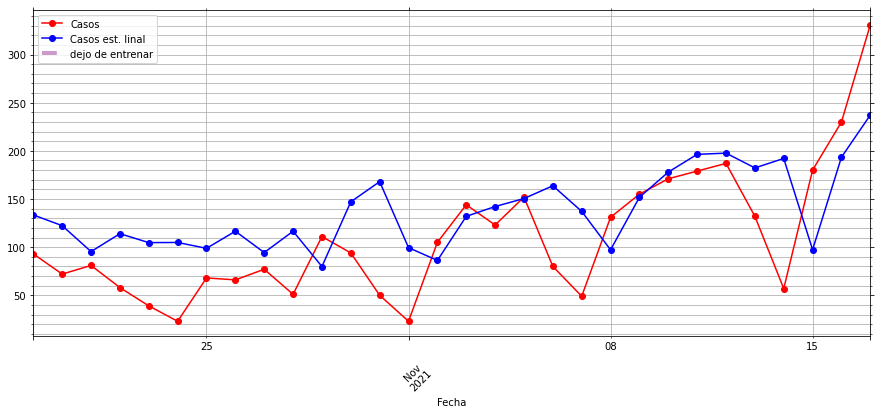

(-8.12918432445381, 109.0231384378416)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-05-03 00:00:00 312.9891304347826 263.121429366433
2021-05-04 00:00:00 312.9891304347826 263.121429366433
2021-05-05 00:00:00 312.9891304347826 263.121429366433
2021-05-06 00:00:00 312.9891304347826 263.121429366433
2021-05-07 00:00:00 312.9891304347826 263.121429366433
2021-05-08 00:00:00 312.9891304347826 263.121429366433
2021-05-09 00:00:00 312.9891304347826 263.121429366433
2021-05-10 00:00:00 312.9891304347826 263.121429366433
2021-05-11 00:00:00 312.9891304347826 263.121429366433
2021-05-12 00:00:00 312.9891304347826 263.121429366433
2021-05-13 00:00:00 312.9891304347826 263.121429366433
2021-05-14 00:00:00 312.9891304347826 263.121429366433
2021-05-15 00:00:00 312.9891304347826 263.121429366433
2021-05-16 00:00:00 312.9891304347826 263.121429366433
2021-05-17 00:00:00 312.9891304347826 263.121429366433
2021-05-18 00:00:00 312.9891304347826 263.121429366433
2021-05-19 00:00:00 312.9891304347826 263.121429366433
2021-05-20 00:00:00 312.9891304347826 263.121429366433
2021-05-21

2021-10-24 00:00:00 312.9891304347826 263.121429366433
2021-10-25 00:00:00 312.9891304347826 263.121429366433
2021-10-26 00:00:00 312.9891304347826 263.121429366433
2021-10-27 00:00:00 312.9891304347826 263.121429366433
2021-10-28 00:00:00 312.9891304347826 263.121429366433
2021-10-29 00:00:00 312.9891304347826 263.121429366433
2021-10-30 00:00:00 312.9891304347826 263.121429366433
2021-10-31 00:00:00 312.9891304347826 263.121429366433
2021-11-01 00:00:00 312.9891304347826 263.121429366433
2021-11-02 00:00:00 312.9891304347826 263.121429366433
2021-11-03 00:00:00 312.9891304347826 263.121429366433
2021-11-04 00:00:00 312.9891304347826 263.121429366433
2021-11-05 00:00:00 312.9891304347826 263.121429366433
2021-11-06 00:00:00 312.9891304347826 263.121429366433
2021-11-07 00:00:00 312.9891304347826 263.121429366433
2021-11-08 00:00:00 312.9891304347826 263.121429366433
2021-11-09 00:00:00 312.9891304347826 263.121429366433
2021-11-10 00:00:00 312.9891304347826 263.121429366433
2021-11-11

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-09-04 00:00:00 4.451331255725687 108.4516936921878
2021-09-05 00:00:00 4.323791106887189 108.45606410901645
2021-09-06 00:00:00 4.103683639610406 108.46763337327207
2021-09-07 00:00:00 4.487170692677705 108.44785454394201
2021-09-08 00:00:00 4.510210999788548 108.44673594619474
2021-09-09 00:00:00 4.731353221320205 108.43744939291511
2021-09-10 00:00:00 4.869751458441006 108.42776430778288
2021-09-11 00:00:00 5.179216691592044 108.41394386961157
2021-09-12 00:00:00 4.843306125727477 108.42901672047202
2021-09-13 00:00:00 5.170407115619734 108.41266879590636
2021-09-14 00:00:00 4.974658083039806 108.42376665803299
2021-09-15 00:00:00 5.2584503970082555 108.40886823059182
2021-09-16 00:00:00 5.319056298396669 108.40587185830279
2021-09-17 00:00:00 5.534404177187176 108.39511055246125
2021-09-18 00:00:00 5.722672194620308 108.38708501145878
2021-09-19 00:00:00 5.644420651528985 108.3899234257883
2021-09-20 00:00:00 5.471587166909078 108.39831679350479
2021-09-21 00:00:00 5.7910427805

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-05-16,2021-05-17,2021-05-18,2021-05-19,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,...,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16
Casos,61.00,131.00,260.00,245.00,235.00,197.00,136.00,70.00,126.00,165.00,...,49.00,131.00,155.00,171.00,179.00,187.00,132.00,57.00,180.00,230.00
test coresp,1158.00,2414.00,2942.00,3005.00,2662.00,2448.00,1864.00,1021.00,2279.00,2931.00,...,937.00,2461.00,2626.00,2710.00,2390.00,2348.00,1718.00,1057.00,2482.00,2919.00
Tasa de positividad (%),5.27,5.43,8.84,8.15,8.83,8.05,7.30,6.86,5.53,5.63,...,5.23,5.32,5.90,6.31,7.49,7.96,7.68,5.39,7.25,7.88
Asintomáticos (%),52.00,48.00,51.00,43.00,56.00,52.00,53.00,31.00,49.00,41.00,...,60.00,54.00,59.00,63.00,53.00,30.00,84.00,54.00,49.00,50.00
Casos$^{{-\Delta t}}$,148.00,61.00,131.00,260.00,245.00,235.00,197.00,136.00,70.00,126.00,...,80.00,49.00,131.00,155.00,171.00,179.00,187.00,132.00,57.00,180.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,54.00,46.00,44.00,55.00,54.00,50.00,54.00,23.00,17.00,47.00,...,85.00,63.00,61.00,55.00,85.00,80.00,75.00,63.00,56.00,60.00
Casos$^{-27\cdot \Delta t}$,194.00,345.00,329.00,311.00,245.00,152.00,133.00,297.00,362.00,372.00,...,52.00,26.00,57.00,54.00,74.00,34.00,30.00,87.00,93.00,72.00
test coresp$^{-27\cdot \Delta t}$,2458.00,3241.00,3107.00,2884.00,2456.00,1599.00,1433.00,2759.00,3529.00,3732.00,...,1104.00,921.00,1950.00,1907.00,1215.00,584.00,984.00,2256.00,2649.00,2619.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,7.89,10.64,10.59,10.78,9.98,9.51,9.28,10.76,10.26,9.97,...,4.71,2.82,2.92,2.83,6.09,5.82,3.05,3.86,3.51,2.75


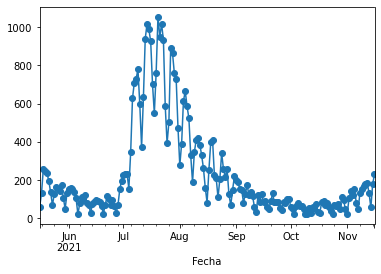

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-05-16'
entrenoHasta = '2021-11-16'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:
X_prima

Fecha,2021-05-16,2021-05-17,2021-05-18,2021-05-19,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,...,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16
Casos,131.0,260.0,245.0,235.0,197.0,136.0,70.0,126.0,165.0,151.0,...,131.0,155.0,171.0,179.0,187.0,132.0,57.0,180.0,230.0,331.0


In [94]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-16,-0.000144,-0.000024,0.001405,0.000188,-0.000188,0.000043,0.005131,-0.000002,-0.000336,0.000028,...,0.004804,-0.000714,-0.000109,-0.000047,-0.000069,0.000449,0.000123,-0.000015,-0.007029,-0.000791
2021-05-17,-0.000373,0.000049,0.006005,0.000082,-0.000038,-0.000044,-0.001691,0.000532,-0.000136,0.000038,...,-0.011494,0.000575,-0.000051,0.000022,0.004485,-0.001091,-0.000031,-0.000054,-0.001012,0.000447
2021-05-18,0.000176,0.000003,-0.000241,0.000899,-0.000503,0.000051,0.004760,-0.000108,0.000185,-0.000050,...,0.005868,0.000302,0.000195,-0.000013,-0.012735,0.000540,-0.000298,0.000015,0.005298,-0.000329
2021-05-19,-0.000072,0.000042,0.007805,-0.000831,0.000226,-0.000024,-0.004566,0.000983,-0.000286,0.000039,...,-0.013652,0.000177,0.000070,-0.000010,-0.002076,0.000242,-0.000286,0.000034,-0.002726,0.000291
2021-05-20,0.000528,-0.000028,0.002013,0.000088,-0.000478,0.000043,0.004379,-0.000368,0.000528,-0.000015,...,-0.009034,0.000176,-0.000162,-0.000019,-0.007081,-0.000550,0.000079,-0.000019,-0.005705,0.000202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-12,0.000082,0.000016,-0.005195,-0.002562,-0.000340,0.000018,0.013412,-0.000402,0.000550,-0.000065,...,0.012410,0.000731,0.000532,-0.000039,-0.014067,0.000891,-0.000091,-0.000029,-0.004159,0.000874
2021-11-13,0.000256,-0.000037,-0.016035,0.001302,-0.000104,0.000052,0.004122,-0.003138,-0.000436,0.000019,...,0.006173,-0.000776,0.000003,0.000021,0.013768,0.001025,0.000375,-0.000060,-0.016809,0.001496
2021-11-14,-0.000105,-0.000014,0.003351,0.000426,0.000160,-0.000025,-0.015564,0.001294,-0.000007,0.000055,...,-0.010657,0.000591,-0.000674,0.000070,0.012423,-0.000931,0.000372,-0.000032,-0.000599,0.001570


In [95]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.586753,0.018577,8.145004,-0.284983,-0.525444,-0.005201,0.215473,0.473973,0.533989,0.003074,...,-3.439431,0.978743,0.22534,-0.011474,-2.528194,-0.144337,-0.493212,0.044953,10.933986,0.148491


In [96]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,290.943198


In [97]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-05-21    197.0
2021-05-22    136.0
2021-05-23     70.0
2021-05-24    126.0
2021-05-25    165.0
              ...  
2021-11-13    132.0
2021-11-14     57.0
2021-11-15    180.0
2021-11-16    230.0
2021-11-17    331.0
Name: Casos, Length: 181, dtype: float64

In [98]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-05-21,217.949034
2021-05-22,111.503200
2021-05-23,88.555557
2021-05-24,118.797491
2021-05-25,211.094835
...,...
2021-11-13,145.243446
2021-11-14,59.495676
2021-11-15,172.405328


In [99]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-11-18'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-05-21,197.0,217.949034
2021-05-22,136.0,111.503200
2021-05-23,70.0,88.555557
2021-05-24,126.0,118.797491
2021-05-25,165.0,211.094835
...,...,...
2021-11-14,57.0,59.495676
2021-11-15,180.0,172.405328
2021-11-16,230.0,196.250841


In [100]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-05-21 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-11-13,132.0,145.243446,120.938256
2021-11-14,57.0,59.495676,83.200302
2021-11-15,180.0,172.405328,142.384881
2021-11-16,230.0,196.250841,210.362963
2021-11-17,331.0,314.237188,225.843834
2021-11-18,NaN,370.776084,245.167010
2021-11-19,NaN,NaN,250.723831
2021-11-20,NaN,NaN,198.427976
2021-11-21,NaN,NaN,138.887560
2021-11-22,NaN,NaN,240.373507


(-0.5722593570266645, 27.063919052435523)

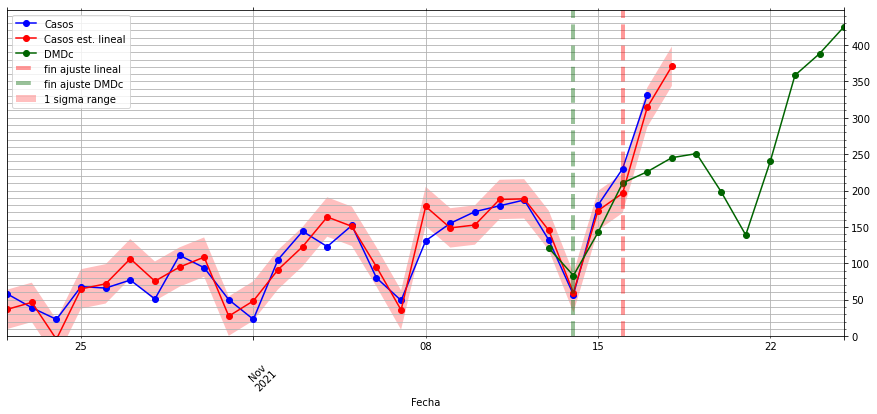

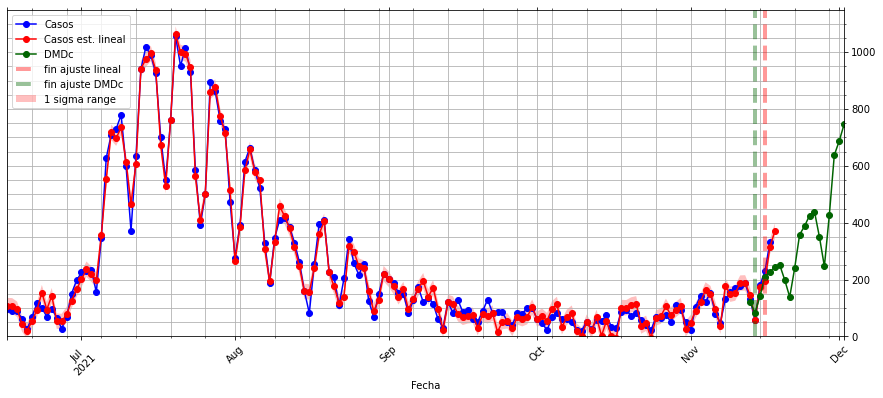

In [101]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

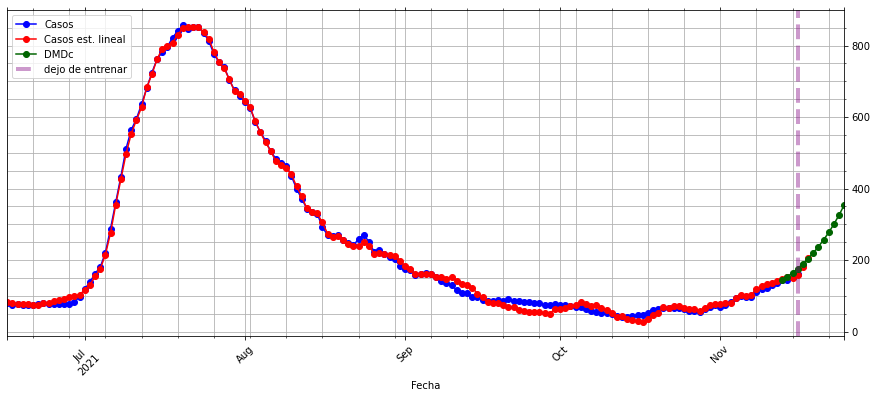

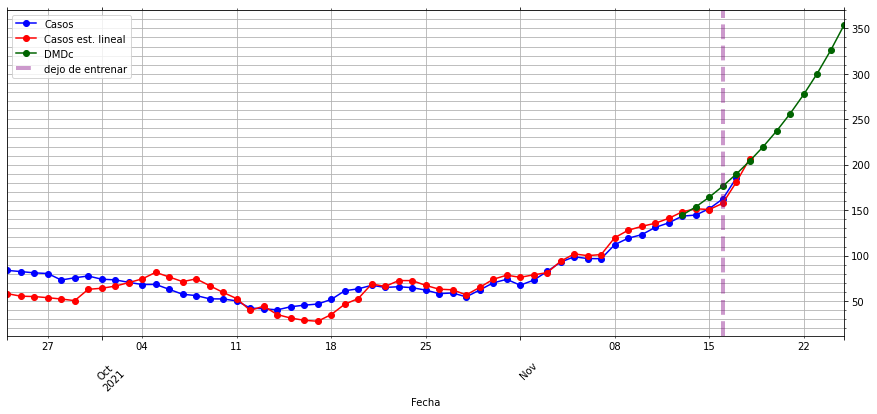

In [102]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [103]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(-0.5722593570266645, 27.063919052435523)

In [104]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

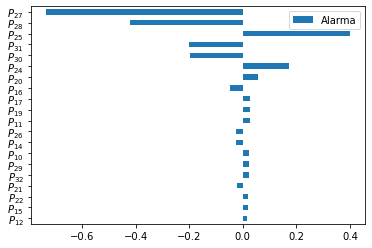

In [105]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

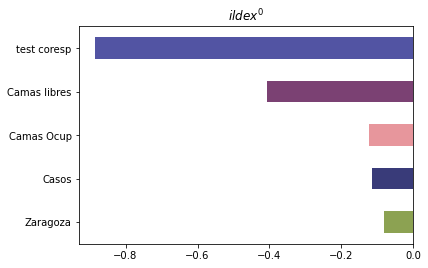

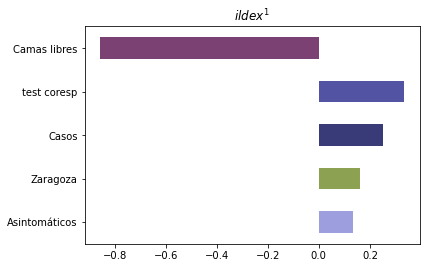

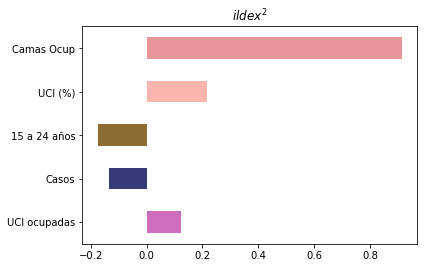

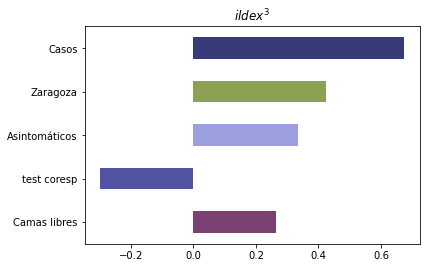

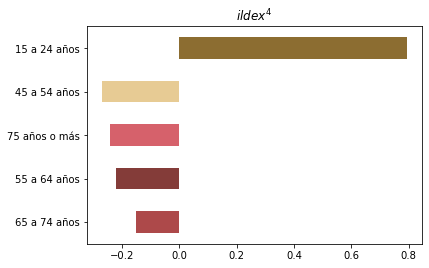

...

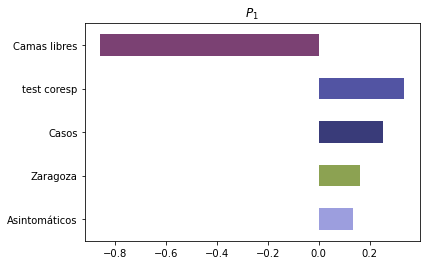

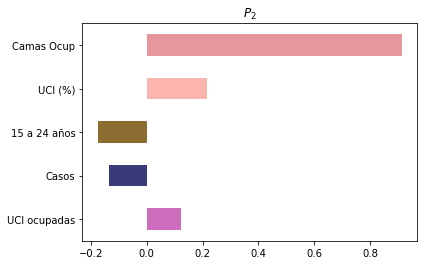

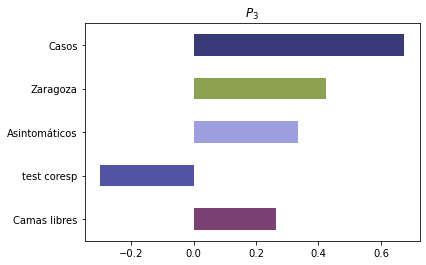

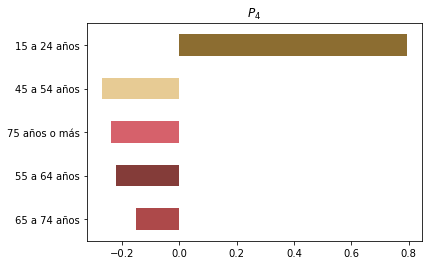

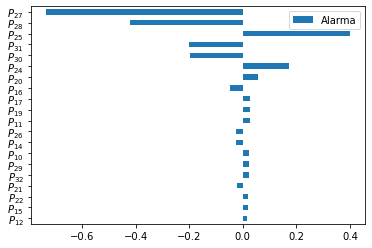

KeyError: 'Total Casos 65 a 74 años'

In [106]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes